# **Slide-seq lung cell type-aware Harreman analysis**

In [1]:
import harreman
import os
import json
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import itertools
from scipy.stats import pearsonr, wilcoxon, mannwhitneyu, ranksums, zscore
import random
from sklearn import linear_model
from scipy.stats import hypergeom
import scipy.stats as stats
from statsmodels.stats.multitest import multipletests
from plotnine import *
from matplotlib.patches import Patch
from scipy.cluster.hierarchy import fcluster
import math
from collections import Counter
import warnings
warnings.filterwarnings("ignore")


BASE_PATH = "/home/projects/nyosef/oier/Harreman_files/Slide_seq_lung"
ADATA_PATH = os.path.join(BASE_PATH, 'h5ads')
DATA_PATH = os.path.join(BASE_PATH, 'data')
PLOTS_PATH = os.path.join(BASE_PATH, 'plots')

## Harreman analysis

In [2]:
adata = harreman.read_h5ad(os.path.join(ADATA_PATH, 'Slide_seq_lung_Harreman_adata.h5ad'))

In [3]:
st_adata = sc.read_h5ad(os.path.join(ADATA_PATH, 'Slide_seq_lung_DestVI_v2_adata.h5ad'))

In [4]:
adata = adata[adata.obs_names.isin(st_adata.obs_names)].copy()

In [5]:
cell_types = [ct for ct in st_adata.obsm['proportions'].columns if 'additional' not in ct]
df_z = st_adata.obsm['proportions'][cell_types].apply(zscore, axis=0)
assigned_cell_types = df_z.idxmax(axis=1)
adata.obs['cell_type'] = assigned_cell_types

In [6]:
cell_communication_df = adata.uns['ccc_results']['cell_com_df_gp_sig'].copy()

In [7]:
gene_pairs_per_metabolite = adata.uns['gene_pairs_per_metabolite']
    
def to_tuple(x):
    # Recursively convert lists to tuples
    if isinstance(x, list):
        return tuple(to_tuple(i) for i in x)
    return x

metabolite_gene_pair_df = pd.DataFrame.from_dict(gene_pairs_per_metabolite, orient="index").reset_index()
metabolite_gene_pair_df = metabolite_gene_pair_df.rename(columns={"index": "metabolite"})
metabolite_gene_pair_df['gene_pair'] = metabolite_gene_pair_df['gene_pair'].apply(
    lambda arr: [(to_tuple(gp[0]), to_tuple(gp[1])) for gp in arr]
)
metabolite_gene_pair_df['gene_type'] = metabolite_gene_pair_df['gene_type'].apply(
    lambda arr: [(to_tuple(gt[0]), to_tuple(gt[1])) for gt in arr]
)
metabolite_gene_pair_df = pd.concat([
    metabolite_gene_pair_df['metabolite'],
    metabolite_gene_pair_df.explode('gene_pair')['gene_pair'],
    metabolite_gene_pair_df.explode('gene_type')['gene_type'],
], axis=1).reset_index(drop=True)

if 'LR_database' in adata.uns:
    LR_database = adata.uns['LR_database']
    df_merged = pd.merge(metabolite_gene_pair_df, LR_database, left_on='metabolite', right_on='interaction_name', how='left')
    LR_df = df_merged.dropna(subset=['pathway_name'])
    metabolite_gene_pair_df['metabolite'][metabolite_gene_pair_df.metabolite.isin(LR_df.metabolite)] = LR_df['pathway_name']

In [8]:
metabolite_gene_pair_df = metabolite_gene_pair_df.set_index('metabolite')

In [9]:
metabolites = ['L-Lactate', 'L-Arginine', 'Sodium_calcium exchange', 'Adenosine diphosphate ribose']

In [10]:
def is_present(row, gene_pairs):
    gene1, gene2 = row['Gene 1'], row['Gene 2']
    return any(
        (gene1 in pair and gene2 in pair) if isinstance(pair, tuple) else False
        for pair in gene_pairs
    )

gene_pairs = metabolite_gene_pair_df.loc[metabolites]['gene_pair'].tolist()
cell_communication_df_filt = cell_communication_df[cell_communication_df.apply(lambda row: is_present(row, gene_pairs), axis=1)]

In [11]:
gene_pairs_filt = list(zip(cell_communication_df_filt["Gene 1"], cell_communication_df_filt["Gene 2"]))

In [12]:
def harreman_pipeline(adata, gene_pairs_filt, metabolites, fix_gp, verbose=False):

    harreman.pp.extract_interaction_db(adata, species='human', database='both', verbose=verbose)
    
    harreman.tl.compute_knn_graph(adata,
                           compute_neighbors_on_key="spatial", 
                           neighborhood_radius=100,
                           weighted_graph=False,
                           sample_key='sample',
                           verbose=verbose)
    
    harreman.tl.compute_gene_pairs(adata, cell_type_key='cell_type', verbose=verbose)
    
    gene_pairs_filt_tmp = [(x, list(y.split(' - ')) if ' - ' in y else y) for x, y in gene_pairs_filt]
    gene_pairs_filt_new = [(list(x.split(' - ')) if ' - ' in x else x, y) for x, y in gene_pairs_filt_tmp]
    
    harreman.tl.compute_ct_cell_communication(adata, model='bernoulli', cell_type_key='cell_type', M = 1000, test = "both", layer_key_p_test='counts', layer_key_np_test='log_norm', subset_gene_pairs=gene_pairs_filt_new, subset_metabolites=metabolites, fix_gp=fix_gp, verbose=verbose)
    
    return adata

In [13]:
fix_gp = True #True or False
adata = harreman_pipeline(adata, gene_pairs_filt, metabolites, fix_gp, verbose=True)

Extracting interaction database...
Finished extracting interaction database in 16.676 seconds
Computing the neighborhood graph...
Restricting graph within samples using 'sample'...


100%|██████████| 7/7 [00:04<00:00,  1.62it/s]


Computing the weights...
Finished computing the KNN graph in 6.569 seconds
Computing gene pairs...
Finished computing gene pairs in 49.118 seconds
Starting cell type-aware cell-cell communication analysis...
Running the parametric test...
Running the non-parametric test...


Permutation test: 100%|██████████| 1000/1000 [1:02:40<00:00,  3.76s/it]


Non-parametric test finished.
Obtaining cell type-aware communication results...
Finished computing cell type-aware cell-cell communication analysis in 3774.141 seconds


In [14]:
harreman.tl.select_significant_interactions(adata, test = "non-parametric", ct_aware = True, threshold = 0.05)

In [4]:
harreman.tl.compute_ct_interacting_cell_scores(adata, test = "both", verbose=True, device='cpu')

Computing cell type-aware gene pair and metabolite scores...
Running the parametric test...
Parametric test finished.
Running the non-parametric test...
Non-parametric test finished.
Finished computing cell type-aware gene pair and metabolite scores in 9.996 seconds


In [5]:
filename = f'{ADATA_PATH}/Slide_seq_lung_ct_Harreman_no_deconv_fix_gp_adata.h5ad' if fix_gp else f'{ADATA_PATH}/Slide_seq_lung_ct_Harreman_no_deconv_adata.h5ad'
harreman.write_h5ad(adata, filename = filename)

## Visualization

### Communication heat map

In [2]:
gp_adata = harreman.read_h5ad(f'{ADATA_PATH}/Slide_seq_lung_ct_Harreman_no_deconv_fix_gp_adata.h5ad')
adata = harreman.read_h5ad(f'{ADATA_PATH}/Slide_seq_lung_ct_Harreman_no_deconv_adata.h5ad')

In [3]:
harreman.tl.select_significant_interactions(gp_adata, test = "non-parametric", ct_aware = True, threshold = 0.05)
harreman.tl.select_significant_interactions(adata, test = "non-parametric", ct_aware = True, threshold = 0.01)

In [4]:
cell_com_df_m_sig_gp = gp_adata.uns['ct_ccc_results']['cell_com_df_m'].copy()
cell_com_df_m_sig = adata.uns['ct_ccc_results']['cell_com_df_m'].copy()

In [5]:
cell_types = ['B cell', 'CD8+ T cell', 'DC', 'Endothelial', 'Fibroblast',
       'Macrophage', 'Mast cell', 'Misc/Undetermined', 'Monocyte', 'NK', 
       'Plasma cell', 'T-Helper', 'Tumor']

In [6]:
cell_com_df_m_sig_gp[['Cell Type 1', 'Cell Type 2']] = cell_com_df_m_sig_gp[['Cell Type 1', 'Cell Type 2']].replace('TAM', 'Macrophage')
cell_com_df_m_sig[['Cell Type 1', 'Cell Type 2']] = cell_com_df_m_sig[['Cell Type 1', 'Cell Type 2']].replace('TAM', 'Macrophage')

In [7]:
cell_com_df_m_sig_gp = cell_com_df_m_sig_gp[(cell_com_df_m_sig_gp['Cell Type 1'].isin(cell_types)) & (cell_com_df_m_sig_gp['Cell Type 2'].isin(cell_types))]
cell_com_df_m_sig = cell_com_df_m_sig[(cell_com_df_m_sig['Cell Type 1'].isin(cell_types)) & (cell_com_df_m_sig['Cell Type 2'].isin(cell_types))]

In [8]:
cell_com_df_m_sig_full_gp = pd.concat([
    cell_com_df_m_sig_gp,
    cell_com_df_m_sig_gp.rename(columns={'Cell Type 1': 'Cell Type 2', 'Cell Type 2': 'Cell Type 1'})
], ignore_index=True).drop_duplicates()

cell_com_df_m_sig_full = pd.concat([
    cell_com_df_m_sig,
    cell_com_df_m_sig.rename(columns={'Cell Type 1': 'Cell Type 2', 'Cell Type 2': 'Cell Type 1'})
], ignore_index=True).drop_duplicates()

In [11]:
cell_com_df_m_sig_full_metab_gp = cell_com_df_m_sig_full_gp[cell_com_df_m_sig_full_gp['metabolite'] == 'L-Lactate'].copy()
cell_com_df_m_sig_full_metab = cell_com_df_m_sig_full[cell_com_df_m_sig_full['metabolite'] == 'L-Lactate'].copy()

diag_lines = cell_com_df_m_sig_full_metab_gp[cell_com_df_m_sig_full_metab_gp['selected']].copy()

# For plotting diagonal lines, define tile corners
diag_lines['x'] = diag_lines['Cell Type 2']
diag_lines['y'] = diag_lines['Cell Type 1']
diag_lines['xend'] = diag_lines['Cell Type 2']
diag_lines['yend'] = diag_lines['Cell Type 1']

# Map to numeric (for line coordinates)
val_sum = 0.5
x_order = {k: i+1 for i, k in enumerate(cell_types)}
diag_lines['x0'] = diag_lines['x'].map(x_order) - val_sum
diag_lines['x1'] = diag_lines['x'].map(x_order) + val_sum
diag_lines['y0'] = diag_lines['y'].map(x_order) - val_sum
diag_lines['y1'] = diag_lines['y'].map(x_order) + val_sum

p = (
    ggplot(cell_com_df_m_sig_full_metab, aes(x='Cell Type 2', y='Cell Type 1')) +
    # Base tiles
    geom_tile(aes(fill='selected'), color='white', show_legend=False) +
    scale_fill_manual(values={True: '#C6DBEF', False: 'white'}) +

    # Diagonal lines for second condition
    geom_segment(
        diag_lines,
        aes(x='x1', y='y0', xend='x0', yend='y1'),
        color='black',
        size=1
    ) +

    # Aesthetics
    theme_classic() +
    theme(axis_text_x=element_text(rotation=45, ha='right', size=12),
            axis_text_y=element_text(size=12),
            axis_title_x=element_text(size=14),
            axis_title_y=element_text(size=14),
            figure_size=(5, 5)) +
    # labs(x='Cell Type 2', y='Cell Type 1')
    labs(x='Cell Type 2', y='Cell Type 1', fill='-log10(FDR)', title='L-Lactate')
)
p
p.save(os.path.join(PLOTS_PATH, 'L_Lactate_ct_Harreman_heat_map_lines.svg'))

In [12]:
cell_com_df_m_sig_full_metab_gp = cell_com_df_m_sig_full_gp[cell_com_df_m_sig_full_gp['metabolite'] == 'Sodium_calcium exchange'].copy()
cell_com_df_m_sig_full_metab = cell_com_df_m_sig_full[cell_com_df_m_sig_full['metabolite'] == 'Sodium_calcium exchange'].copy()

diag_lines = cell_com_df_m_sig_full_metab_gp[cell_com_df_m_sig_full_metab_gp['selected']].copy()

# For plotting diagonal lines, define tile corners
diag_lines['x'] = diag_lines['Cell Type 2']
diag_lines['y'] = diag_lines['Cell Type 1']
diag_lines['xend'] = diag_lines['Cell Type 2']
diag_lines['yend'] = diag_lines['Cell Type 1']

# Map to numeric (for line coordinates)
val_sum = 0.5
x_order = {k: i+1 for i, k in enumerate(cell_types)}
diag_lines['x0'] = diag_lines['x'].map(x_order) - val_sum
diag_lines['x1'] = diag_lines['x'].map(x_order) + val_sum
diag_lines['y0'] = diag_lines['y'].map(x_order) - val_sum
diag_lines['y1'] = diag_lines['y'].map(x_order) + val_sum

p = (
    ggplot(cell_com_df_m_sig_full_metab, aes(x='Cell Type 2', y='Cell Type 1')) +
    # Base tiles
    geom_tile(aes(fill='selected'), color='white', show_legend=False) +
    scale_fill_manual(values={True: '#ABDDA4', False: 'white'}) +

    # Diagonal lines for second condition
    geom_segment(
        diag_lines,
        aes(x='x1', y='y0', xend='x0', yend='y1'),
        color='black',
        size=1
    ) +

    # Aesthetics
    theme_classic() +
    theme(axis_text_x=element_text(rotation=45, ha='right', size=12),
            axis_text_y=element_text(size=12),
            axis_title_x=element_text(size=14),
            axis_title_y=element_text(size=14),
            figure_size=(5, 5)) +
    # labs(x='Cell Type 2', y='Cell Type 1')
    labs(x='Cell Type 2', y='Cell Type 1', fill='-log10(FDR)', title='Sodium/calcium exchange')
)
p
p.save(os.path.join(PLOTS_PATH, 'Sodium_calcium_exchange_ct_Harreman_heat_map_lines.svg'))

### Cell type-aware interacting cell scores

Puck_220408_20


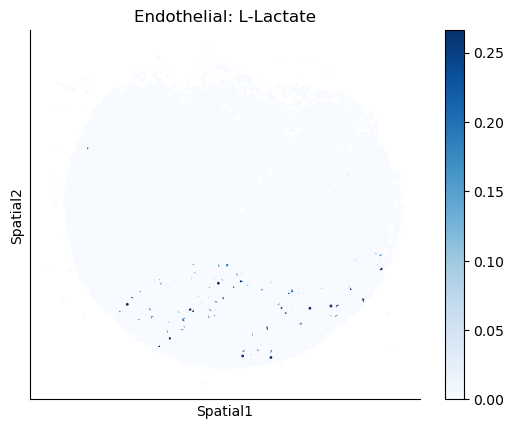

Puck_220408_13


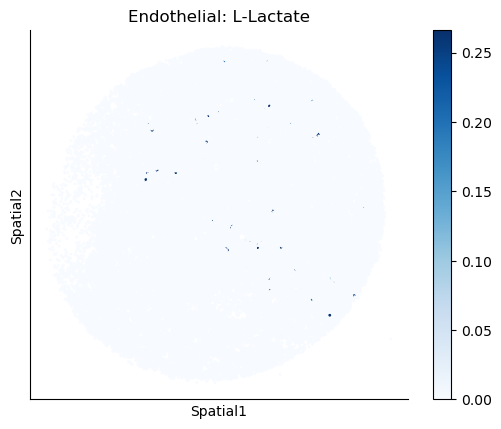

Puck_220408_15


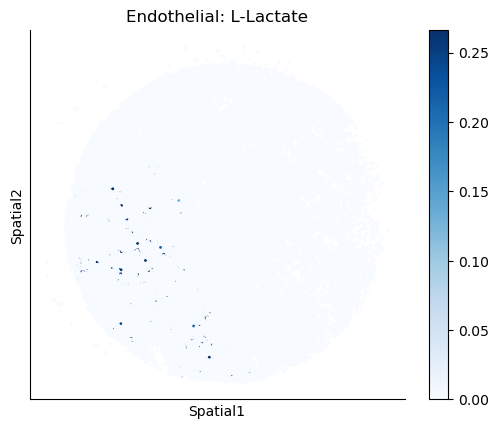

Puck_200727_09


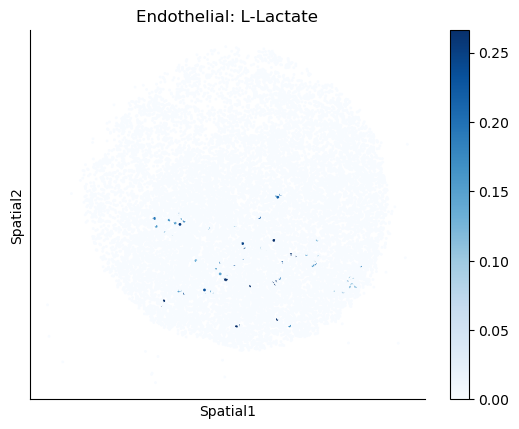

Puck_200727_10


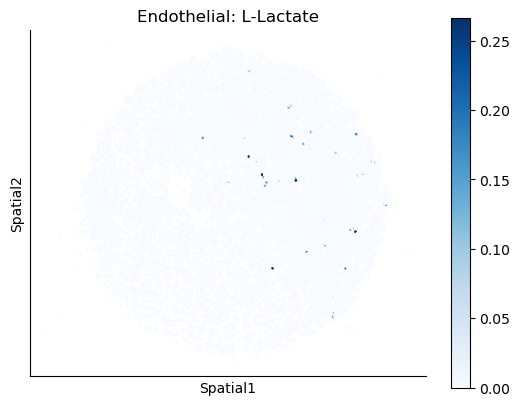

Puck_200727_08


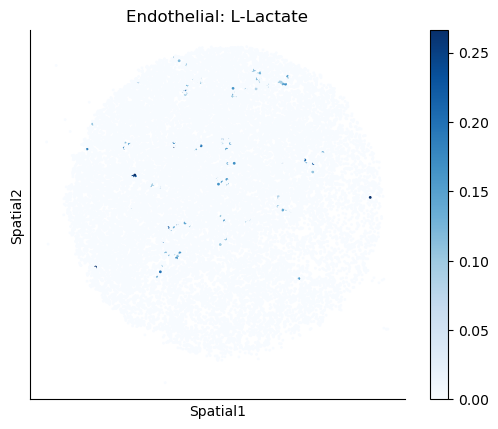

Puck_220408_14


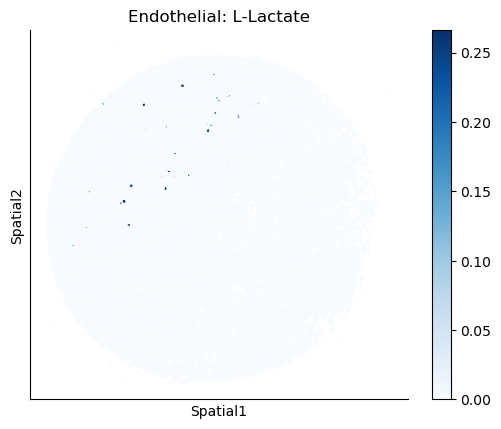

Puck_220408_20


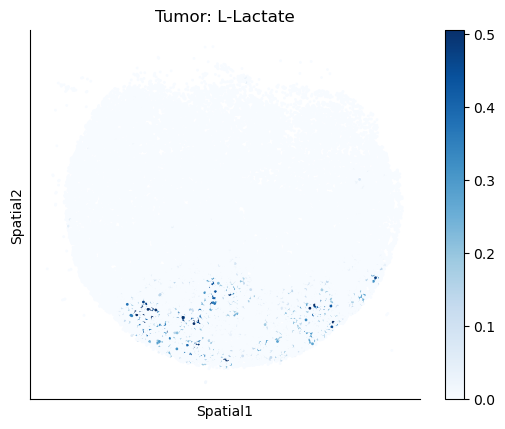

Puck_220408_13


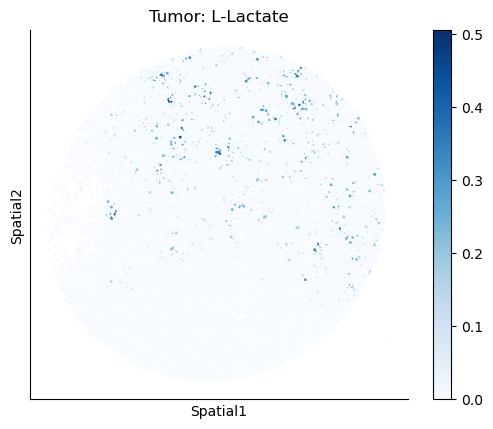

Puck_220408_15


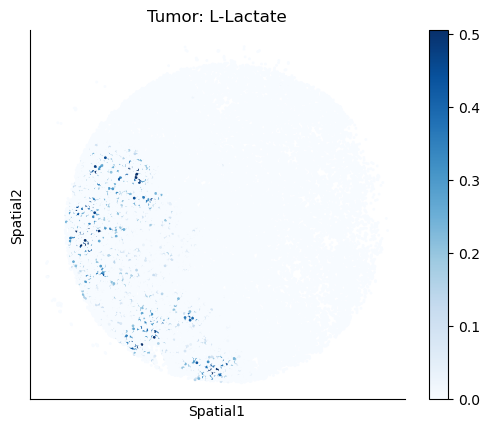

Puck_200727_09


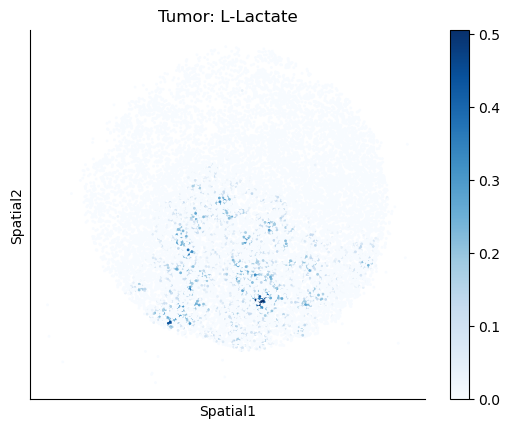

Puck_200727_10


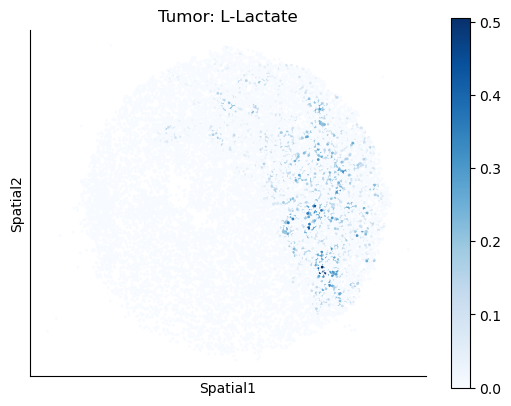

Puck_200727_08


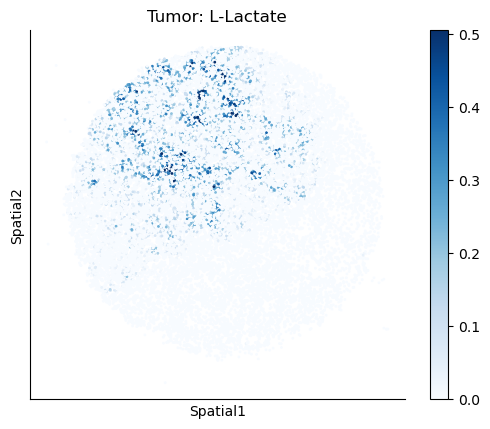

Puck_220408_14


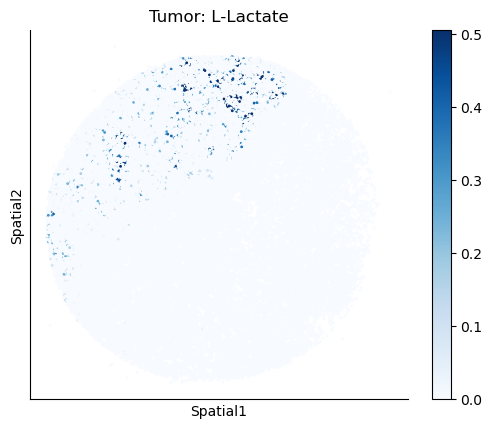

Puck_220408_20


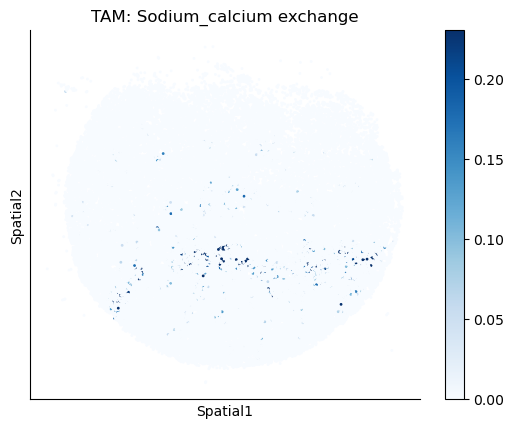

Puck_220408_13


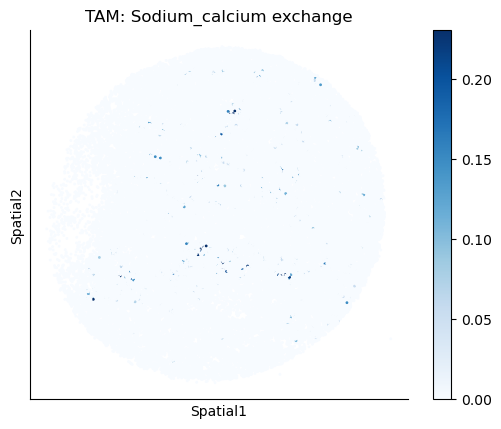

Puck_220408_15


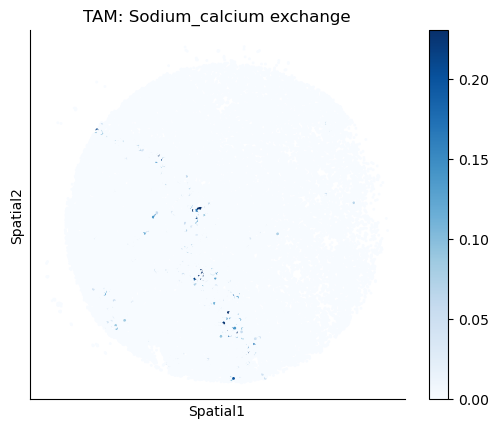

Puck_200727_09


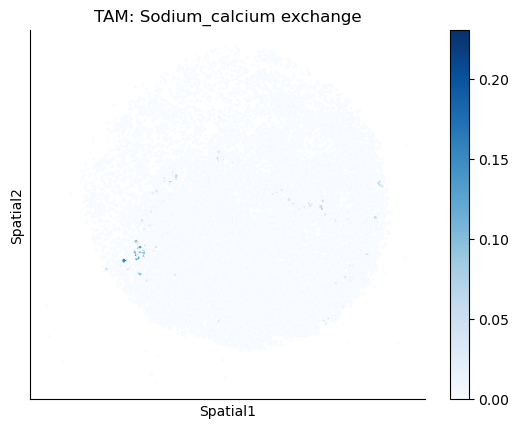

Puck_200727_10


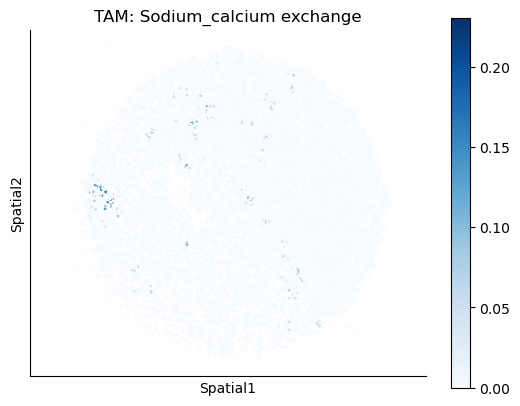

Puck_200727_08


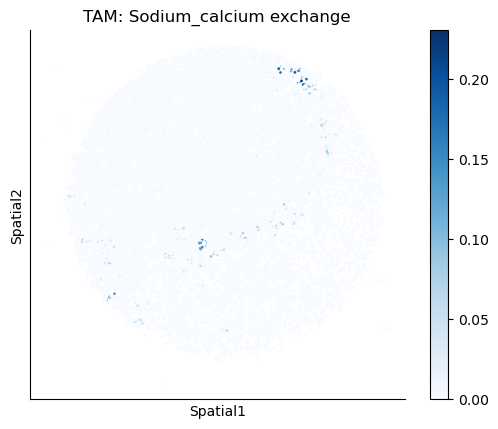

Puck_220408_14


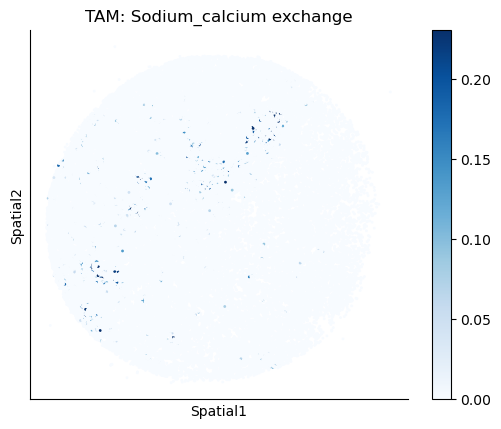

Puck_220408_20


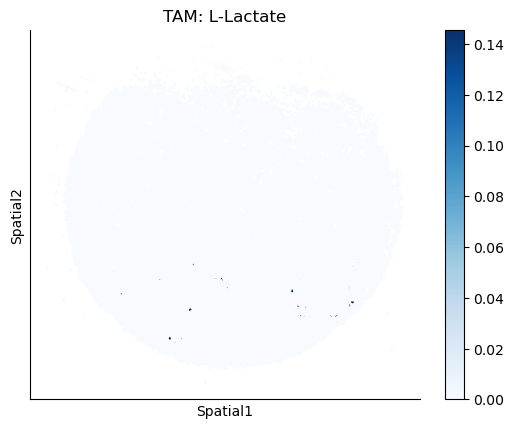

Puck_220408_13


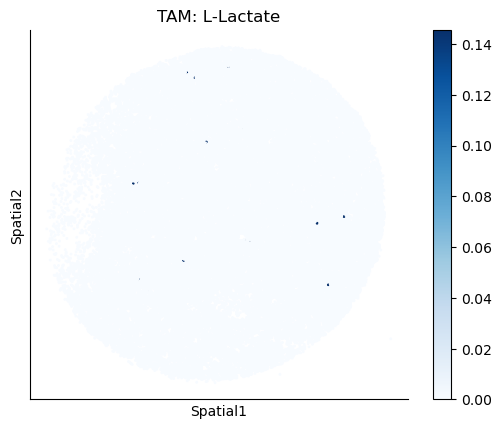

Puck_220408_15


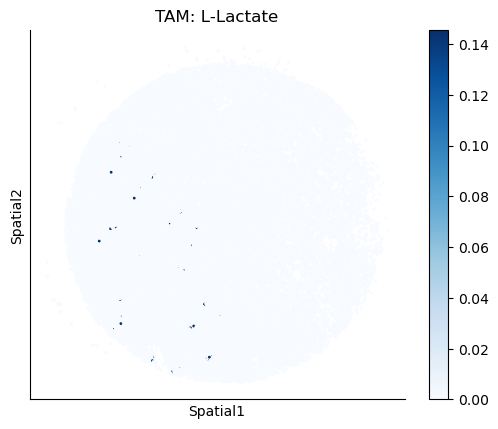

Puck_200727_09


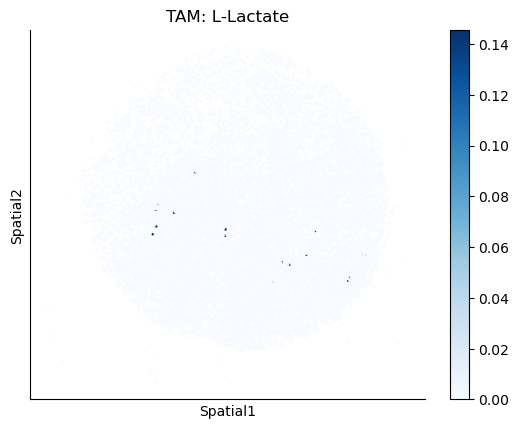

Puck_200727_10


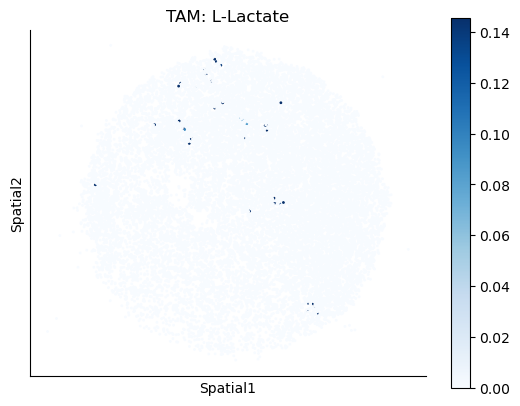

Puck_200727_08


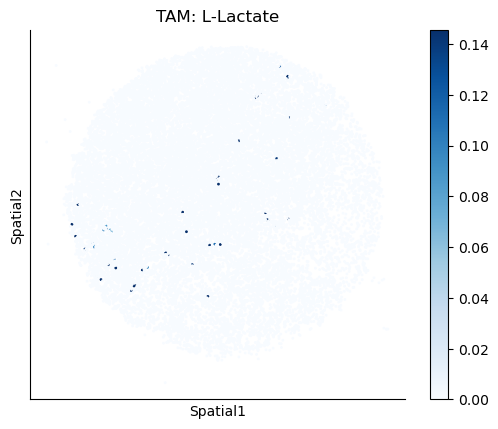

Puck_220408_14


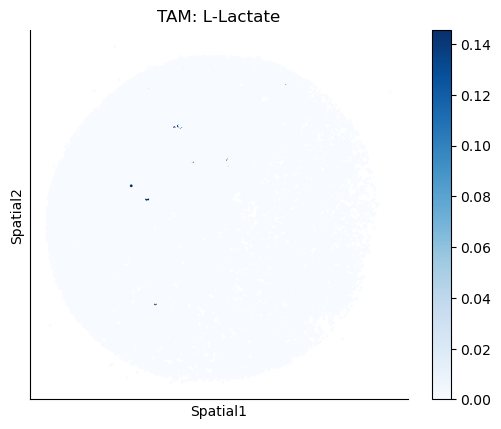

Puck_220408_20


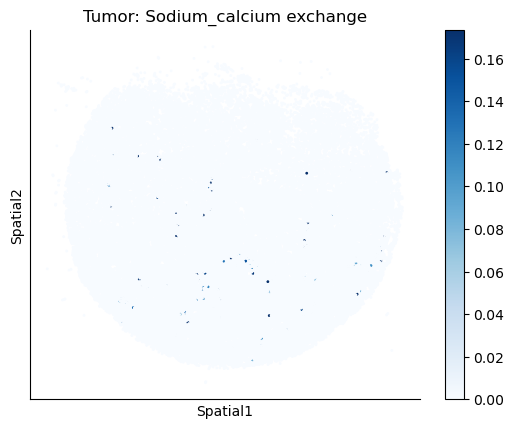

Puck_220408_13


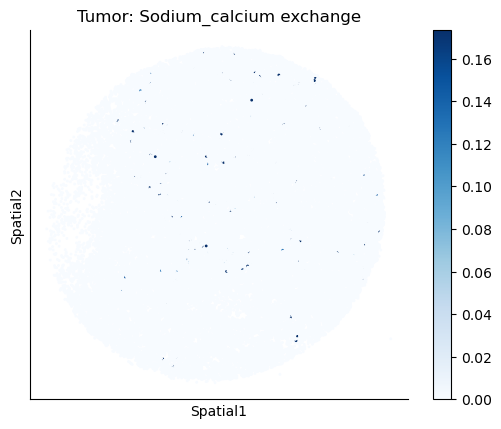

Puck_220408_15


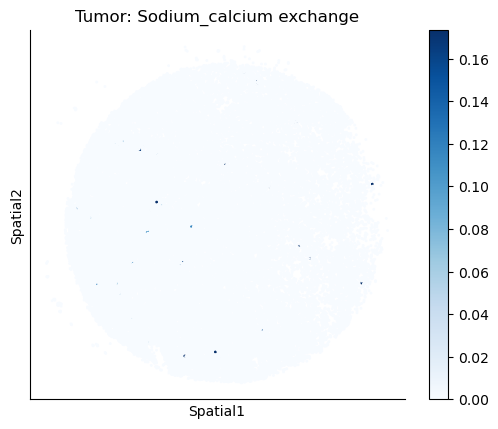

Puck_200727_09


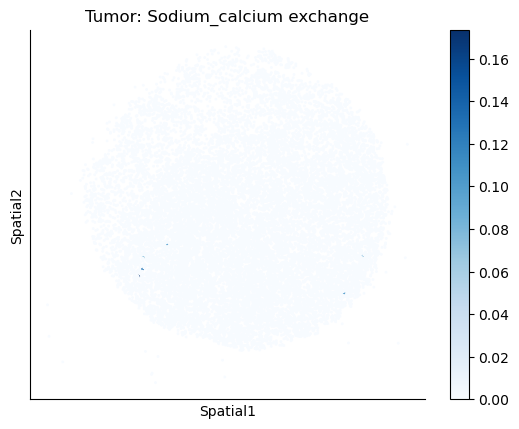

Puck_200727_10


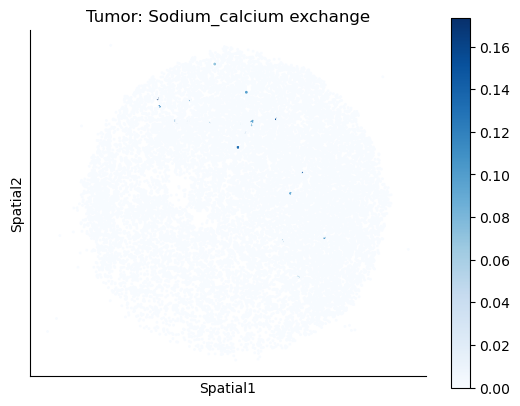

Puck_200727_08


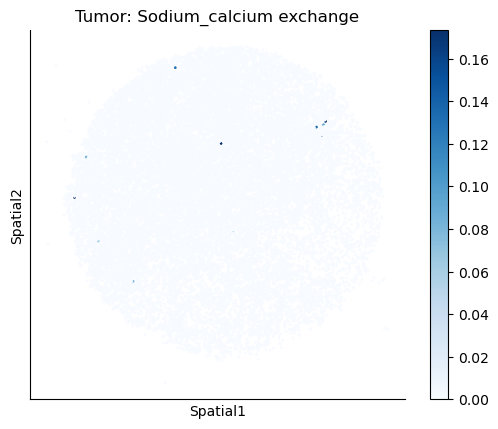

Puck_220408_14


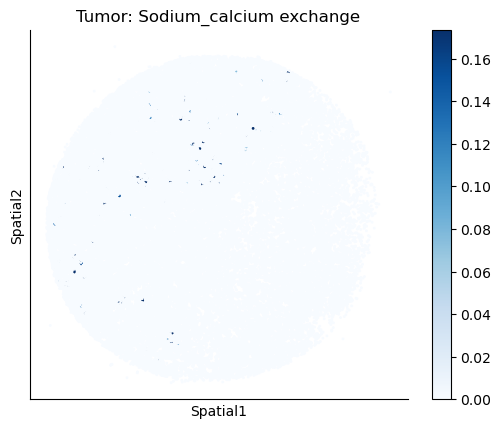

In [24]:
harreman.pl.plot_ct_interacting_cell_scores(adata, interactions=['L-Lactate', 'Sodium_calcium exchange'], cell_type_pair=['Tumor', 'TAM', 'Endothelial'], agg_only=True, test='non-parametric', coords_obsm_key='spatial', s=1, vmin=0, vmax='p99.9', normalize_values=True, cmap='Blues', sample_specific=True)

Puck_200727_10


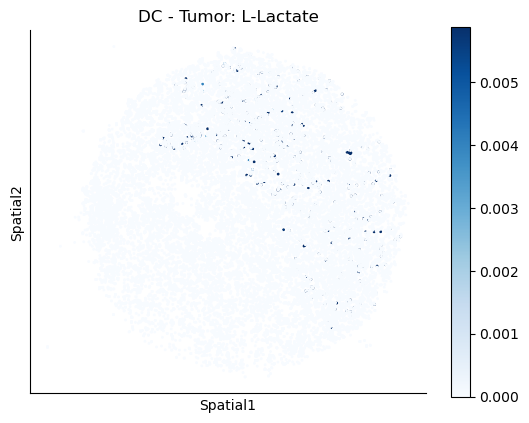

Puck_200727_08


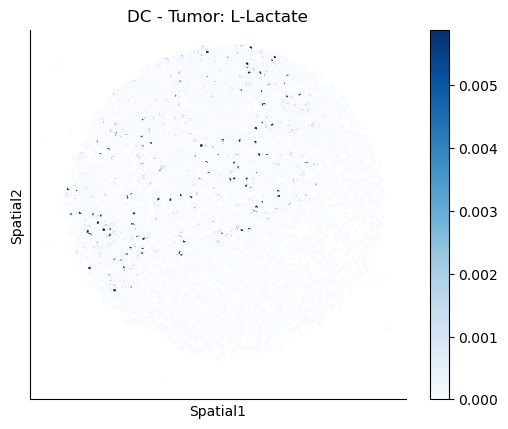

Puck_220408_13


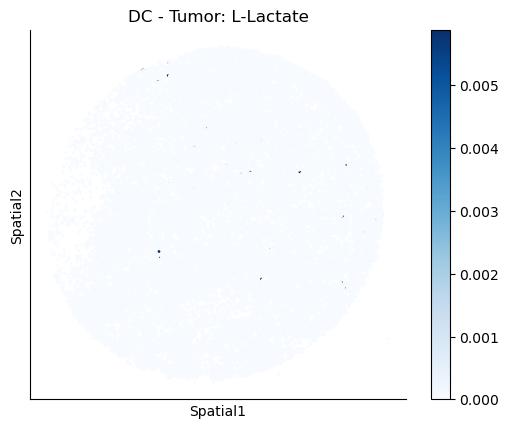

Puck_220408_20


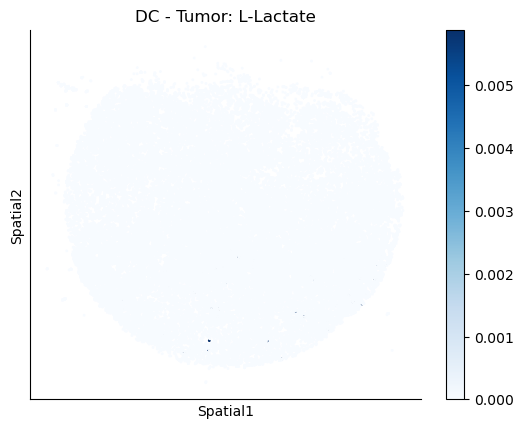

Puck_200727_09


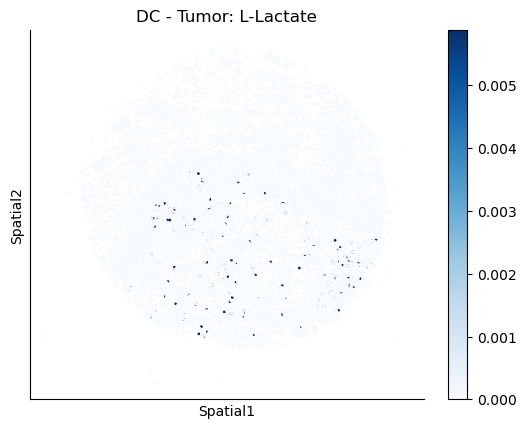

Puck_220408_14


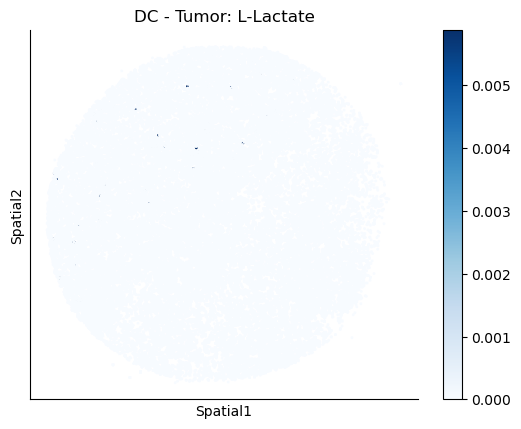

Puck_220408_15


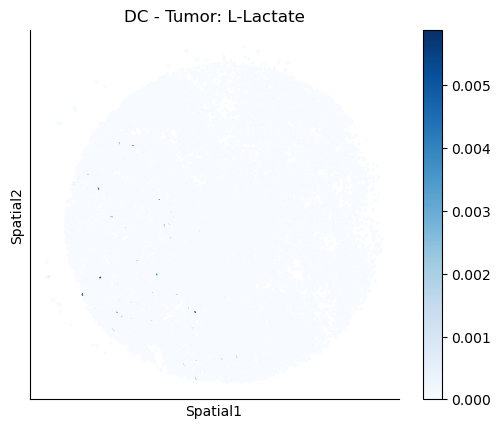

Puck_200727_10


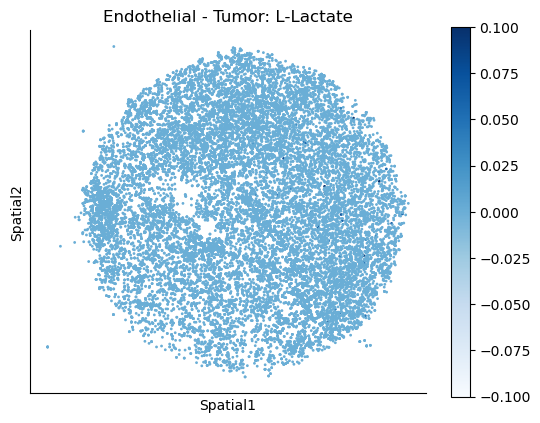

Puck_200727_08


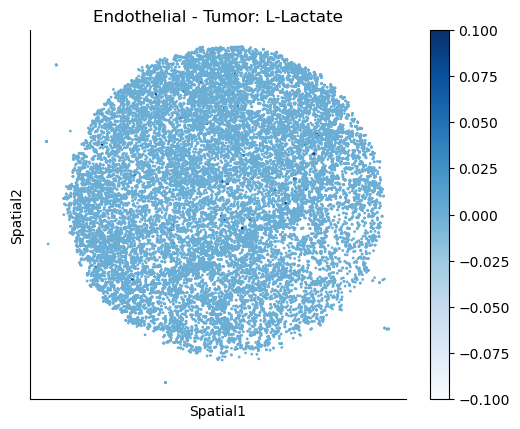

Puck_220408_13


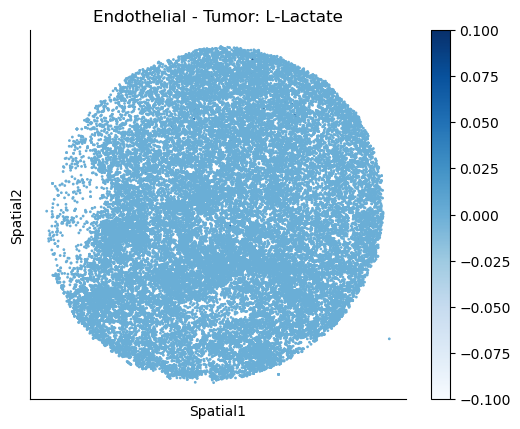

Puck_220408_20


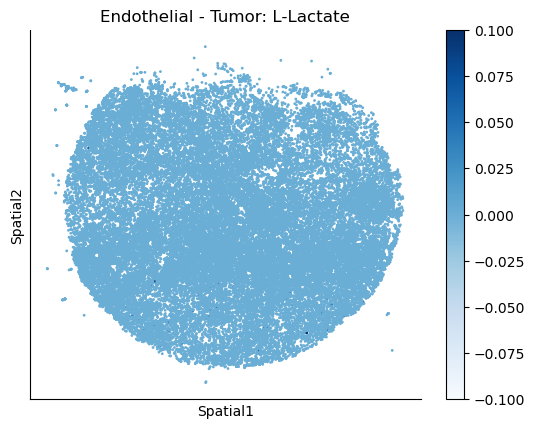

Puck_200727_09


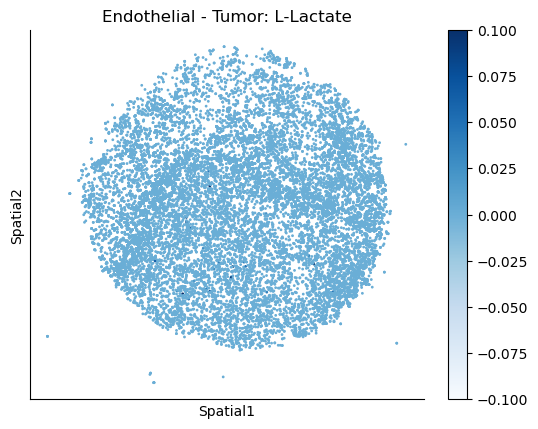

Puck_220408_14


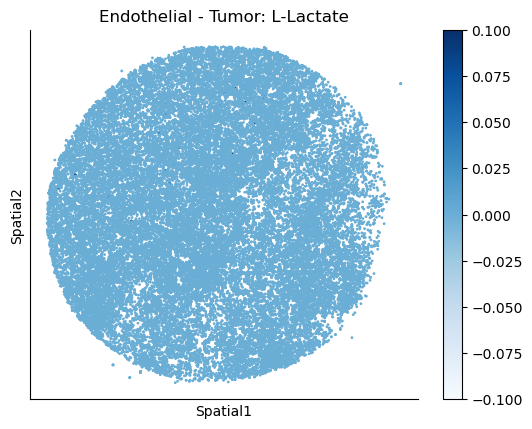

Puck_220408_15


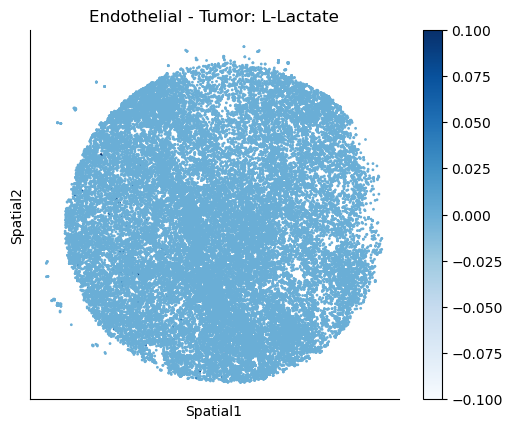

Puck_200727_10


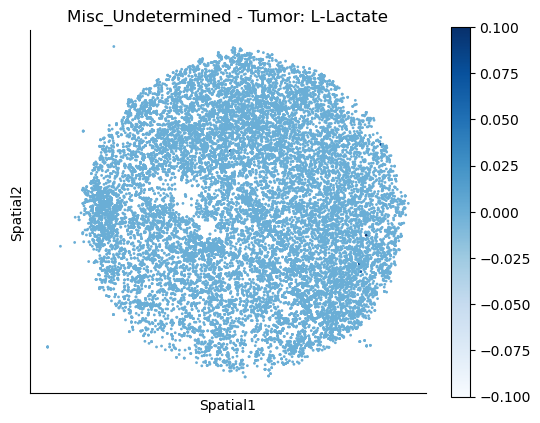

Puck_200727_08


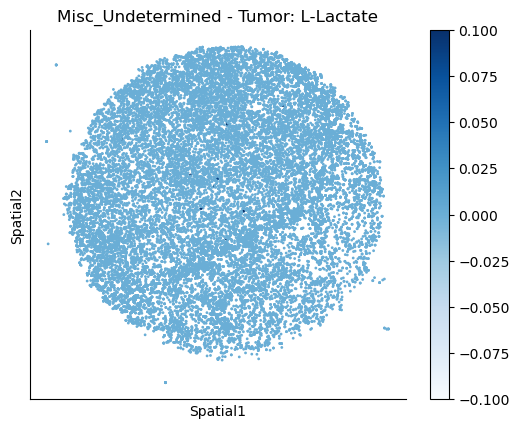

Puck_220408_13


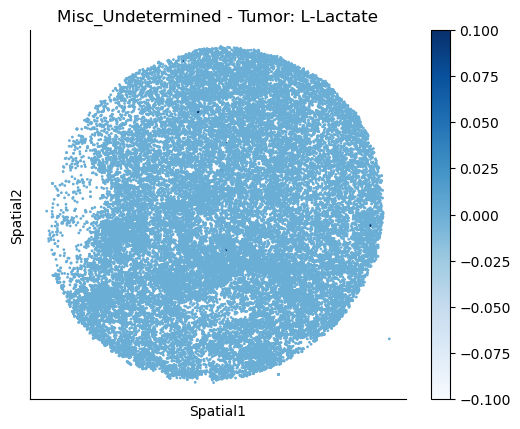

Puck_220408_20


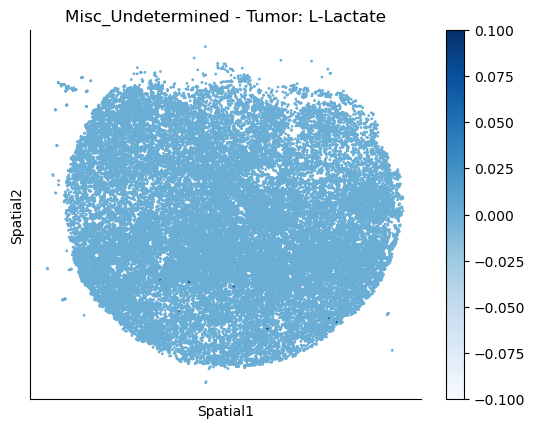

Puck_200727_09


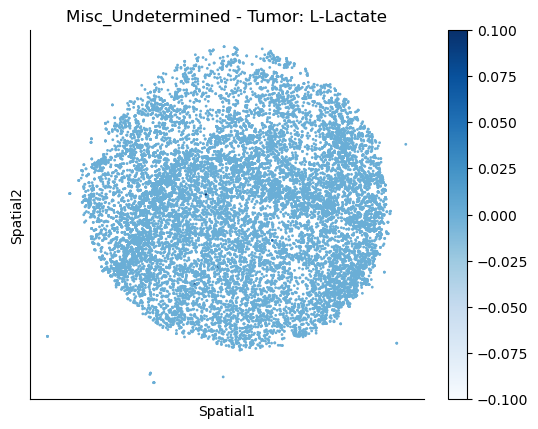

Puck_220408_14


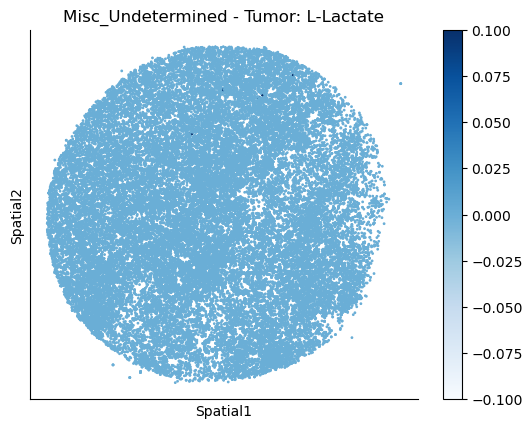

Puck_220408_15


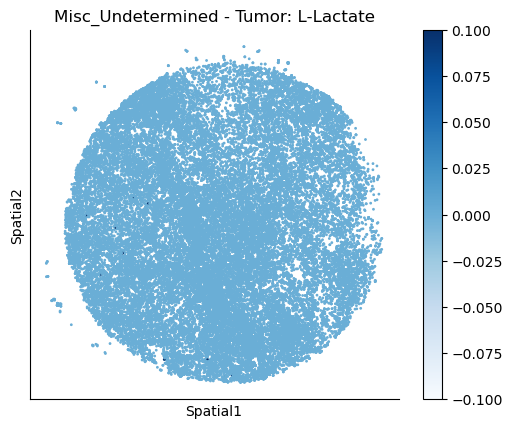

Puck_200727_10


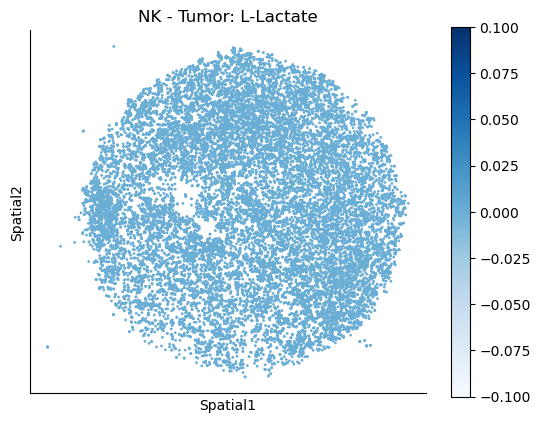

Puck_200727_08


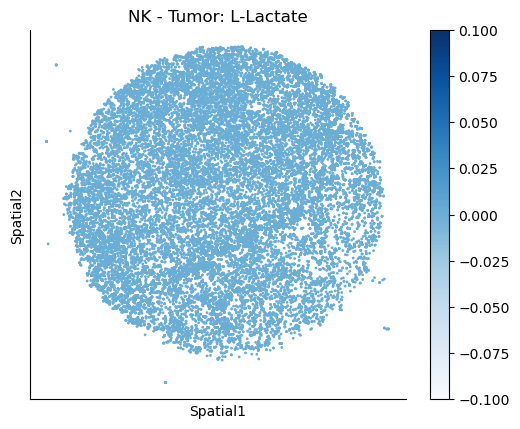

Puck_220408_13


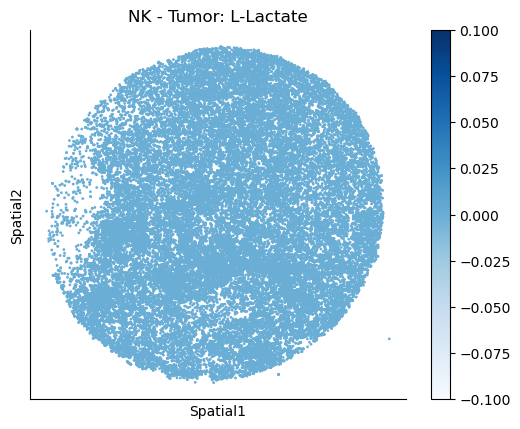

Puck_220408_20


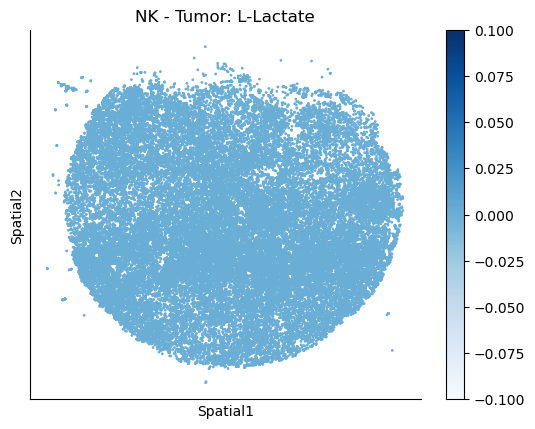

Puck_200727_09


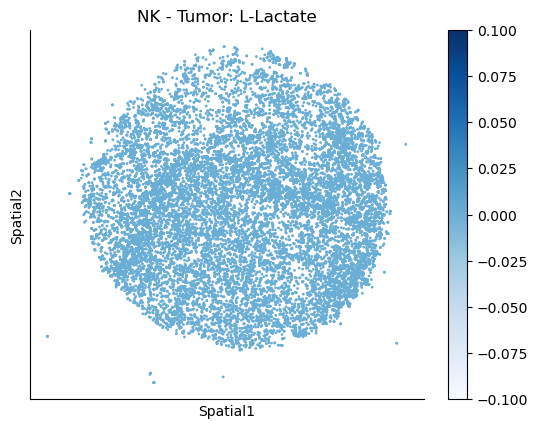

Puck_220408_14


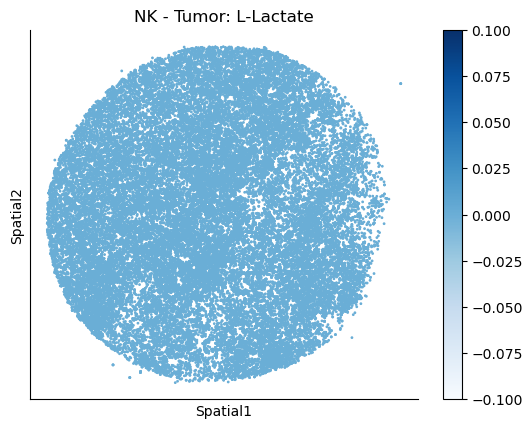

Puck_220408_15


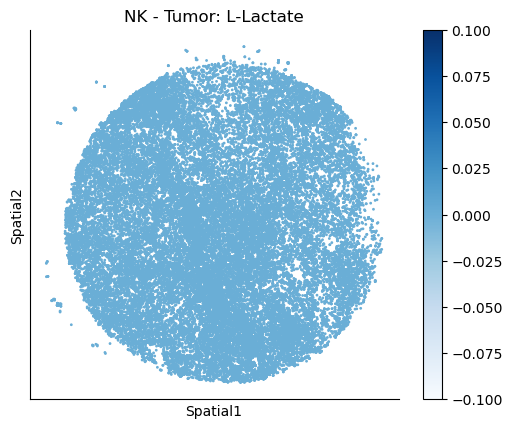

Puck_200727_10


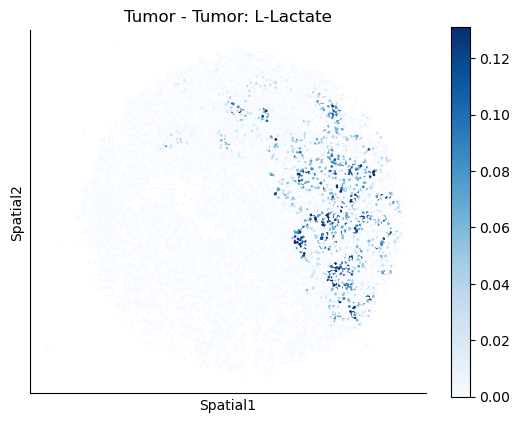

Puck_200727_08


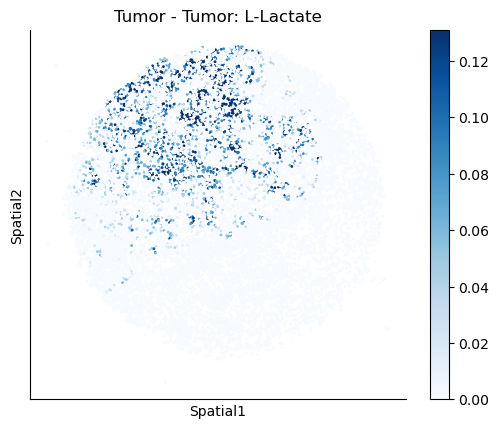

Puck_220408_13


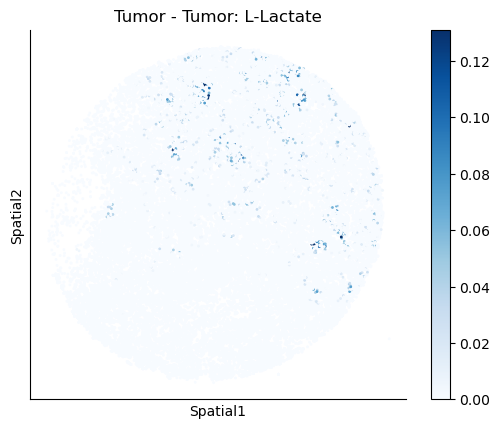

Puck_220408_20


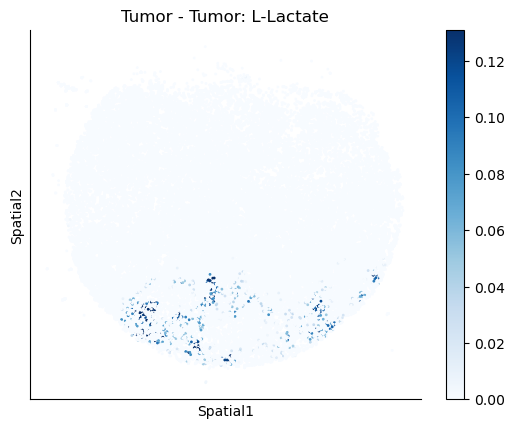

Puck_200727_09


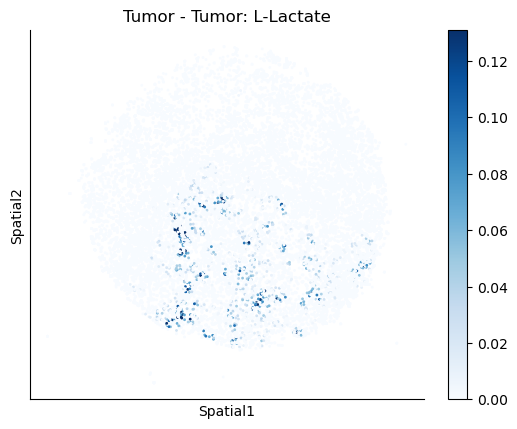

Puck_220408_14


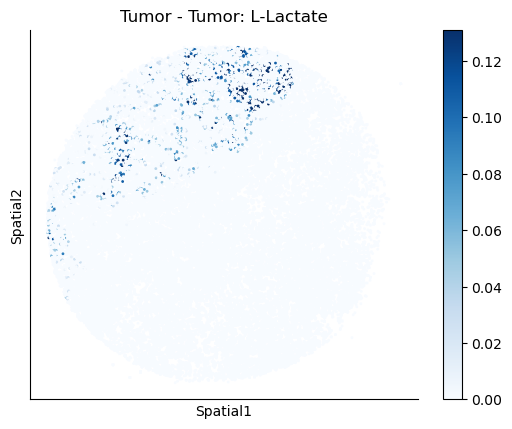

Puck_220408_15


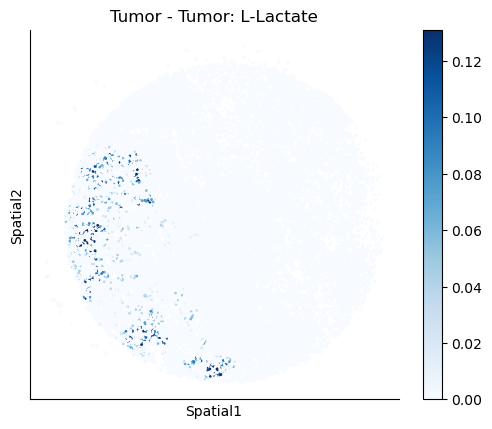

Puck_200727_10


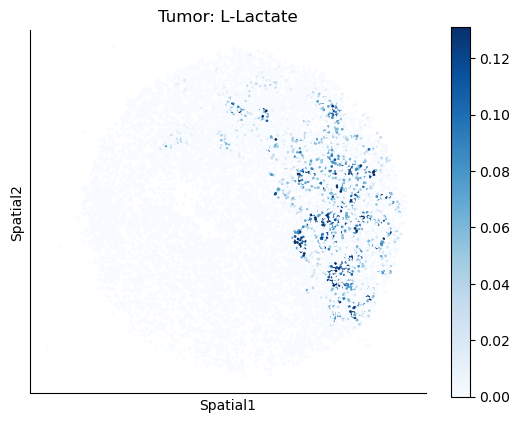

Puck_200727_08


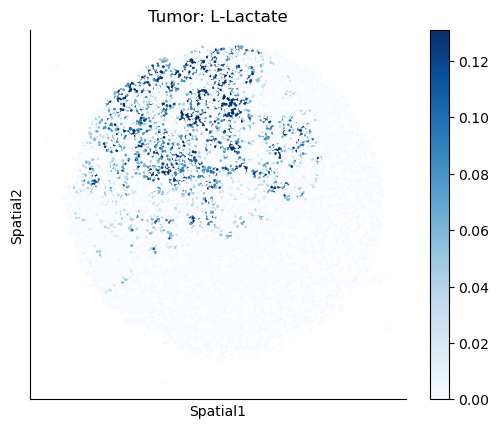

Puck_220408_13


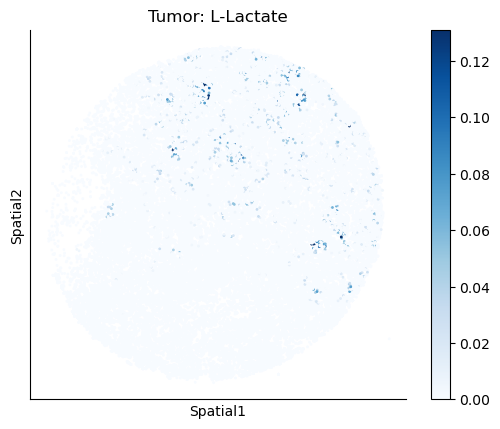

Puck_220408_20


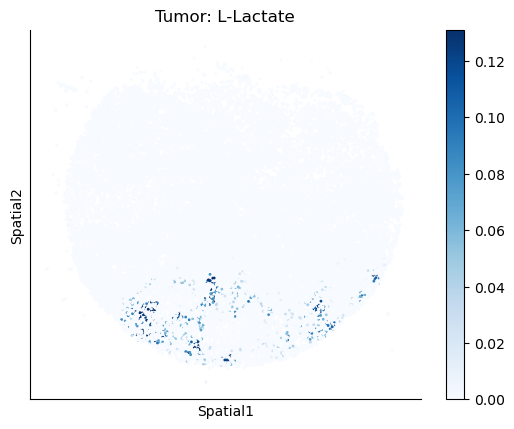

Puck_200727_09


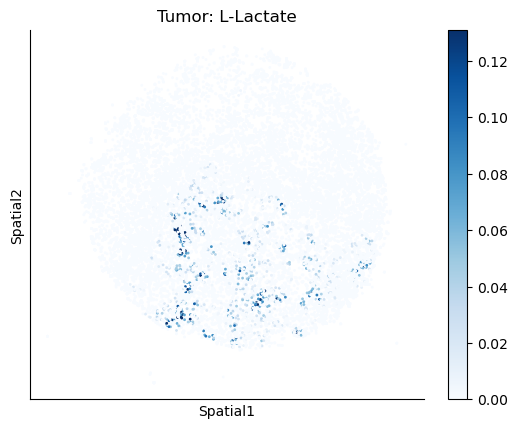

Puck_220408_14


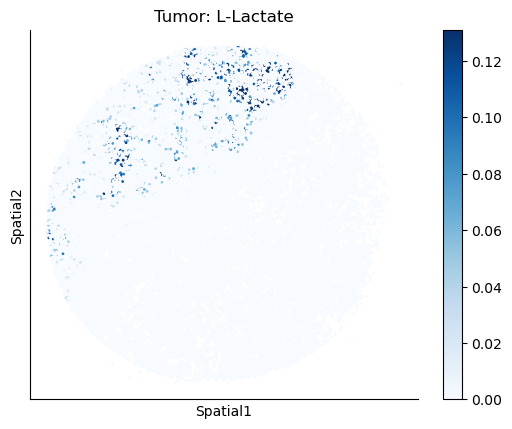

Puck_220408_15


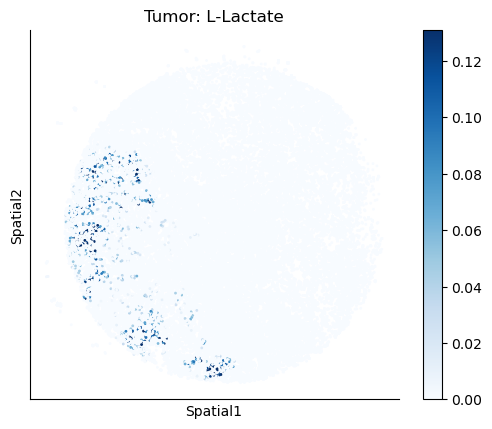

In [8]:
harreman.pl.plot_ct_interacting_cell_scores(adata, interactions=['L-Lactate'], cell_type_pair=['Tumor'], agg_only=False, test='non-parametric', coords_obsm_key='spatial', s=1, vmin=0, vmax='p99.5', normalize_values=True, cmap='Blues', sample_specific=True)

Puck_200727_10


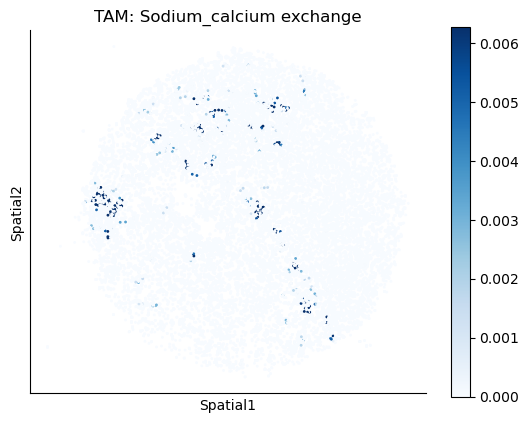

Puck_200727_08


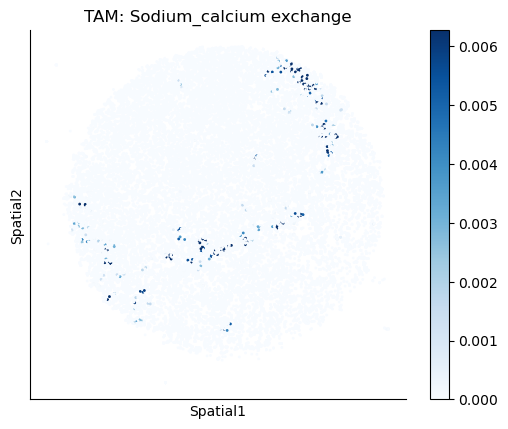

Puck_220408_13


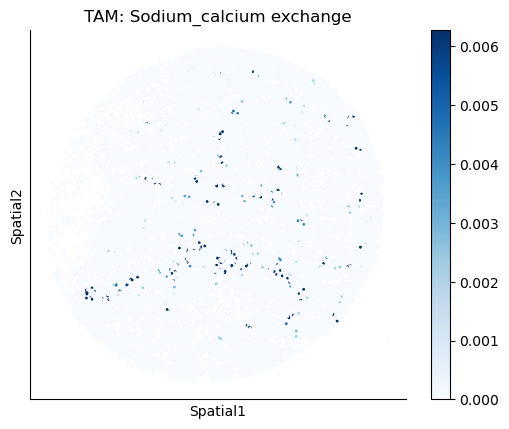

Puck_220408_20


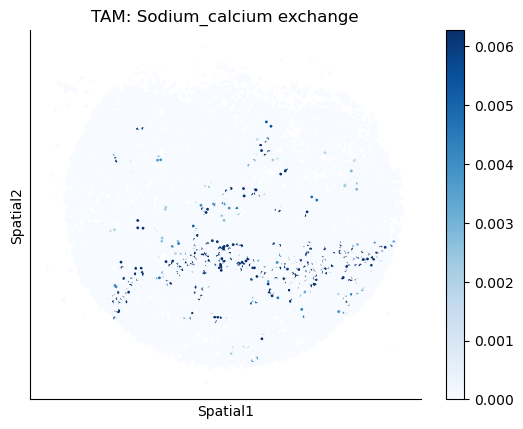

Puck_200727_09


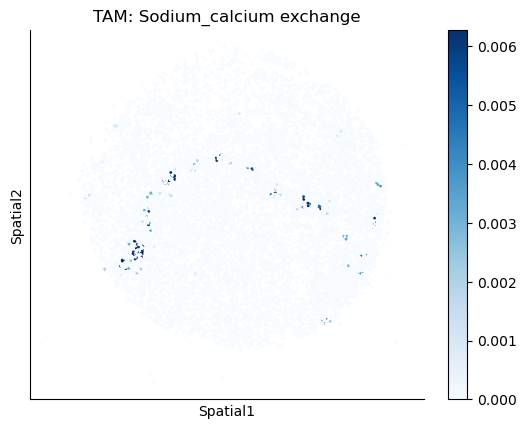

Puck_220408_14


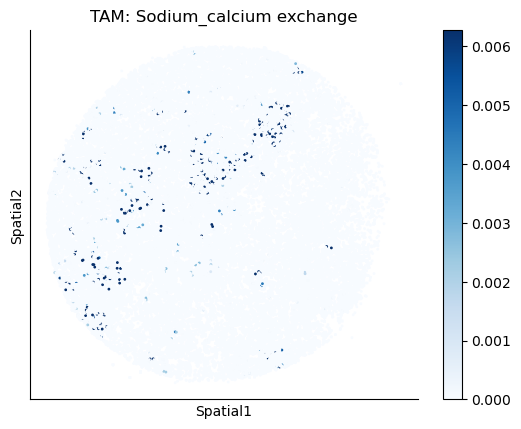

Puck_220408_15


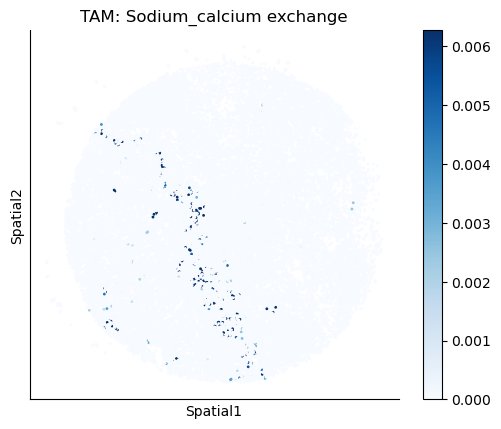

In [14]:
harreman.pl.plot_ct_interacting_cell_scores(adata, interactions=['Sodium_calcium exchange'], cell_type_pair=['TAM'], agg_only=True, test='non-parametric', coords_obsm_key='spatial', s=1, vmin=0, vmax='p99.5', normalize_values=True, cmap='Blues', sample_specific=True)

Puck_200727_10


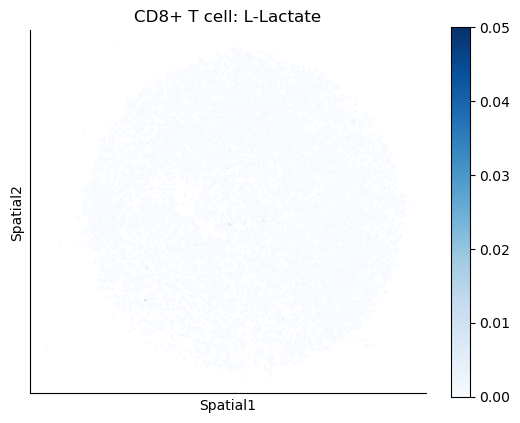

Puck_200727_08


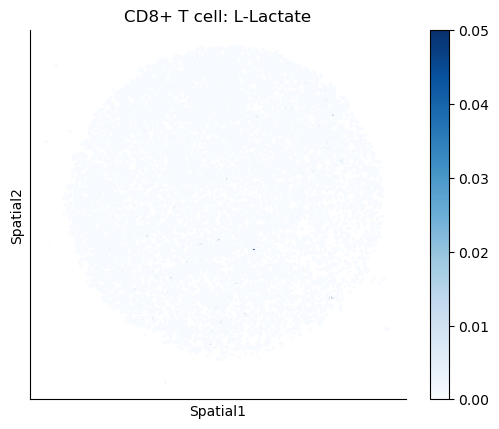

Puck_220408_13


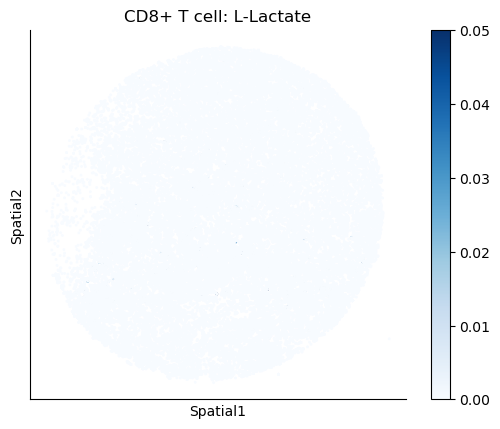

Puck_220408_20


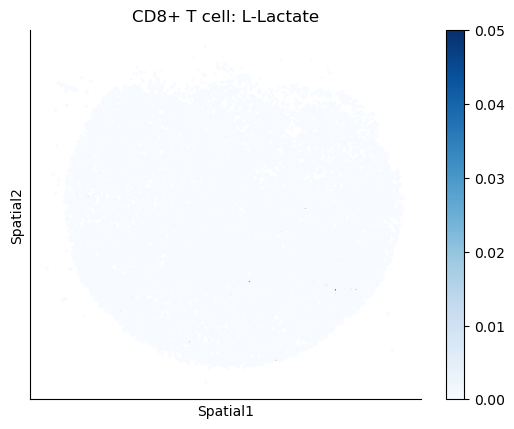

Puck_200727_09


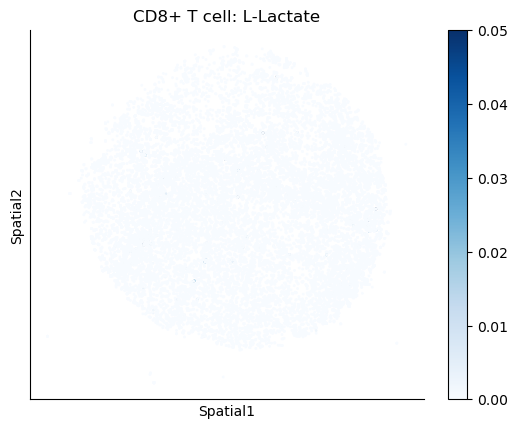

Puck_220408_14


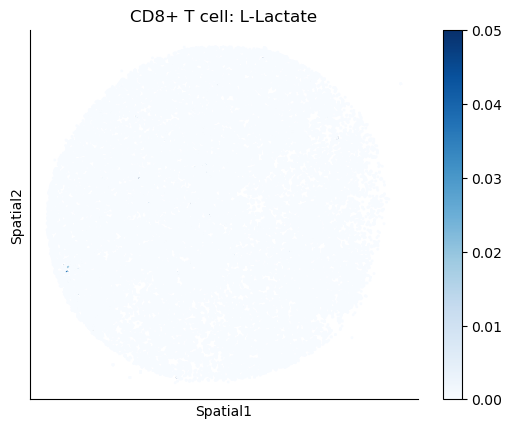

Puck_220408_15


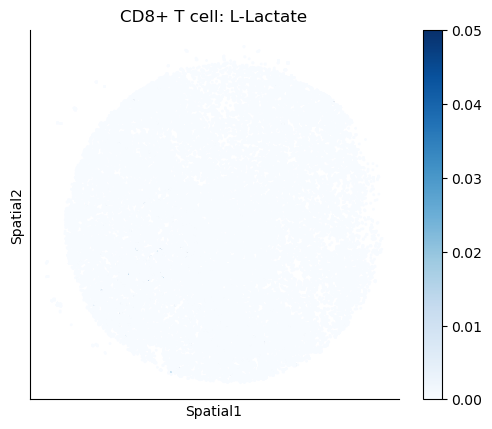

Puck_200727_10


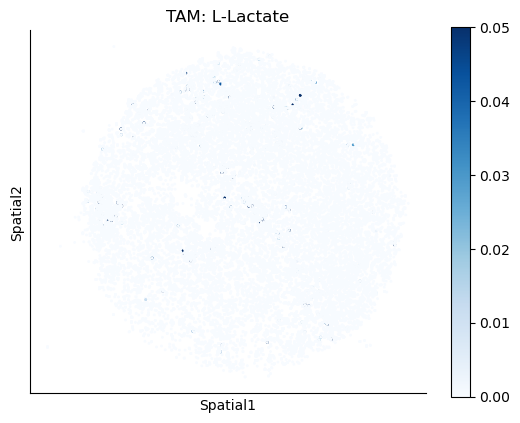

Puck_200727_08


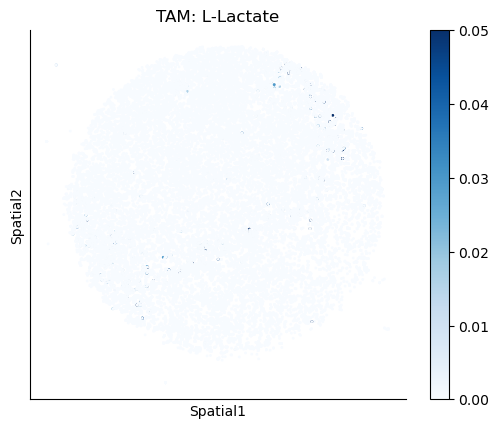

Puck_220408_13


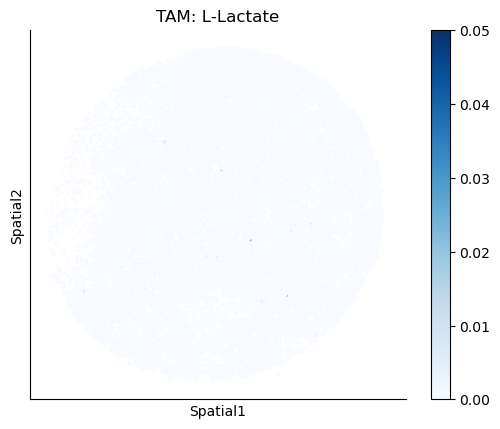

Puck_220408_20


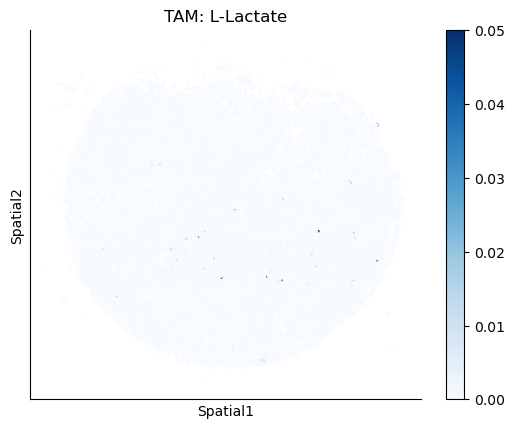

Puck_200727_09


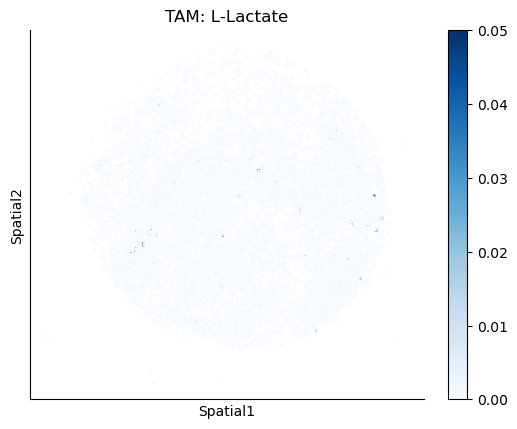

Puck_220408_14


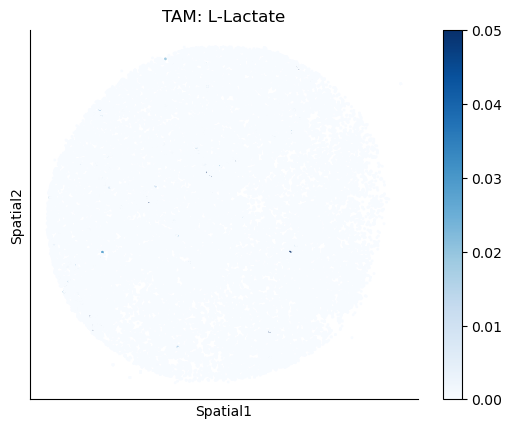

Puck_220408_15


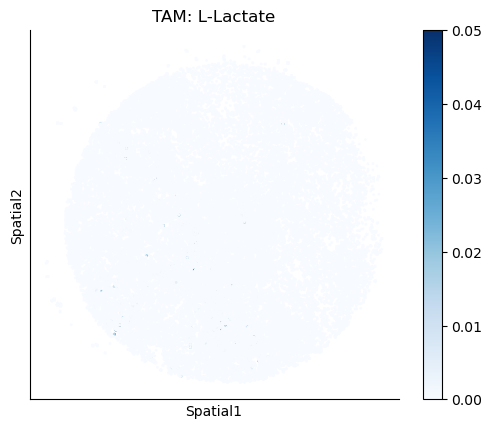

Puck_200727_10


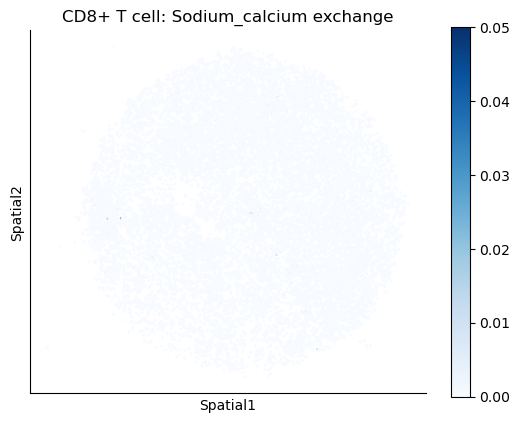

Puck_200727_08


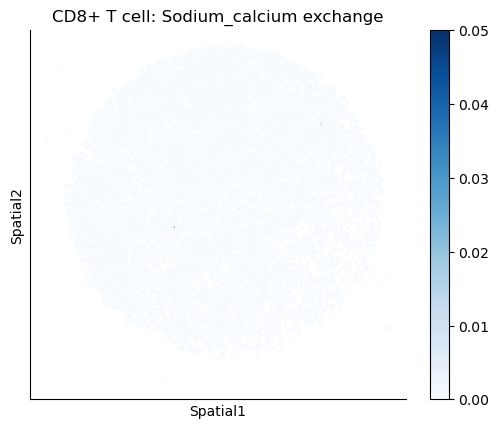

Puck_220408_13


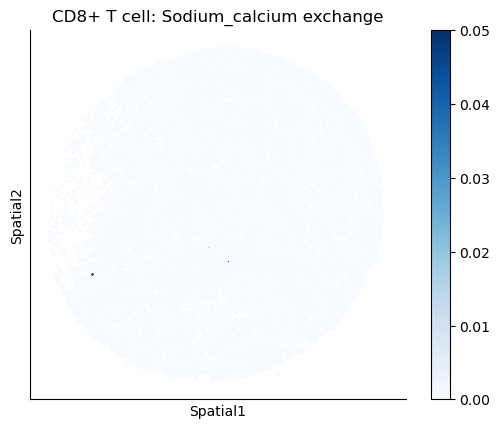

Puck_220408_20


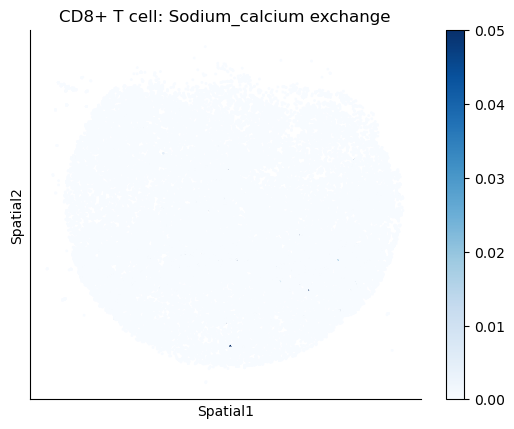

Puck_200727_09


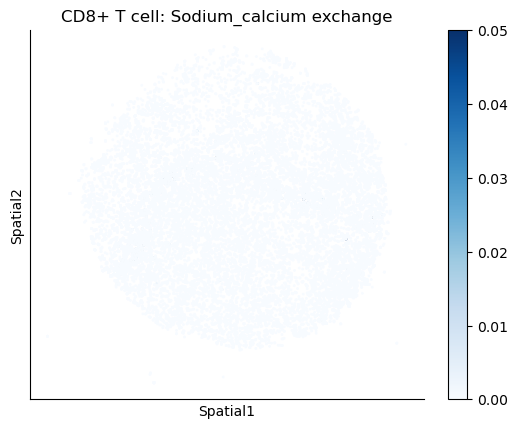

Puck_220408_14


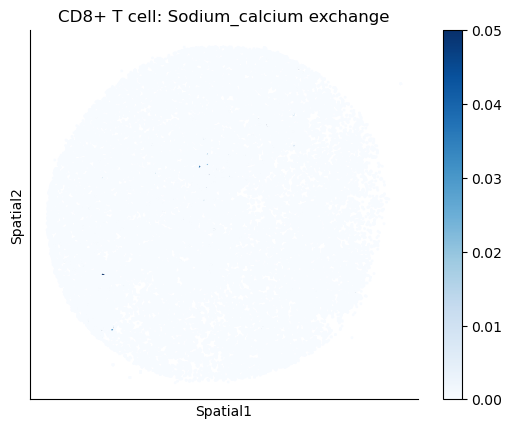

Puck_220408_15


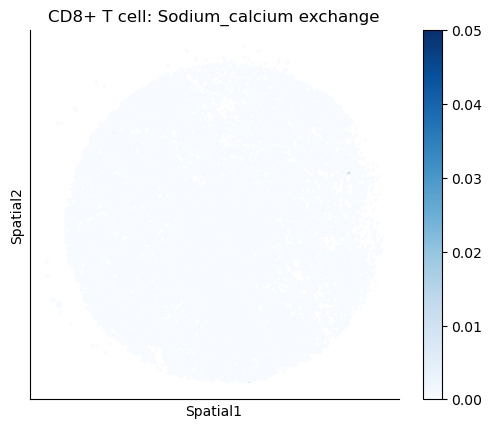

Puck_200727_10


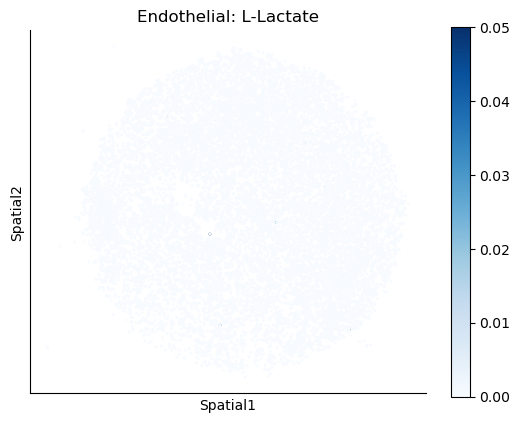

Puck_200727_08


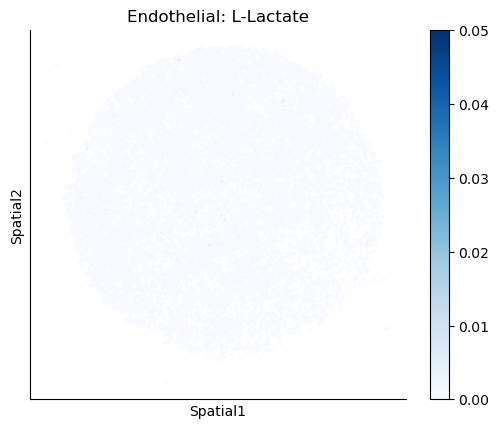

Puck_220408_13


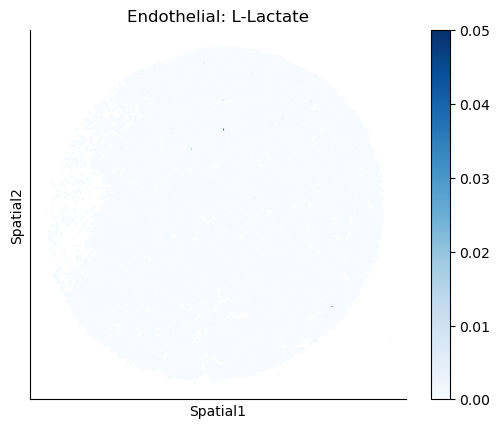

Puck_220408_20


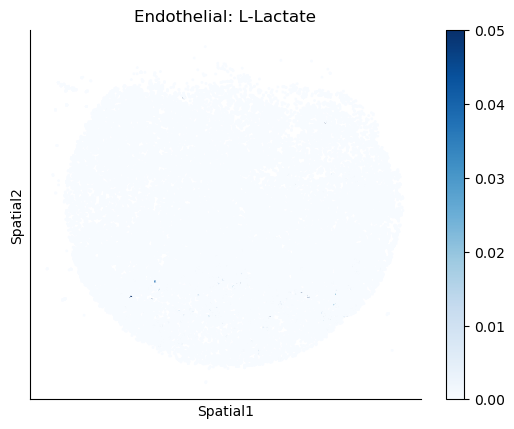

Puck_200727_09


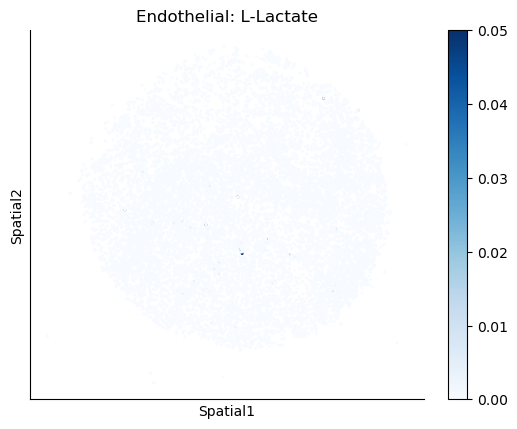

Puck_220408_14


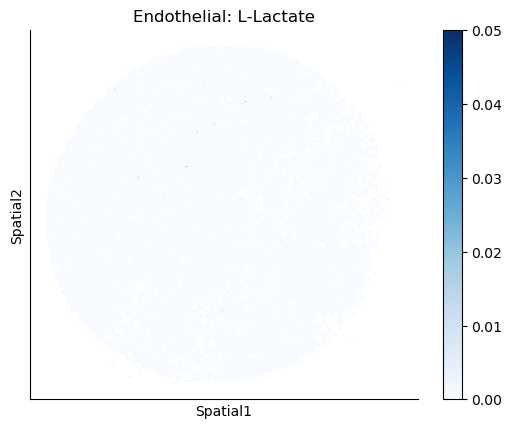

Puck_220408_15


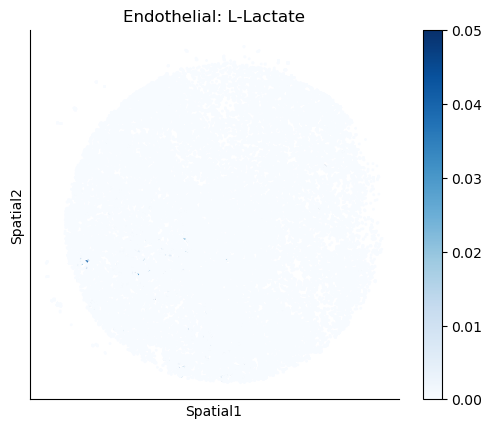

Puck_200727_10


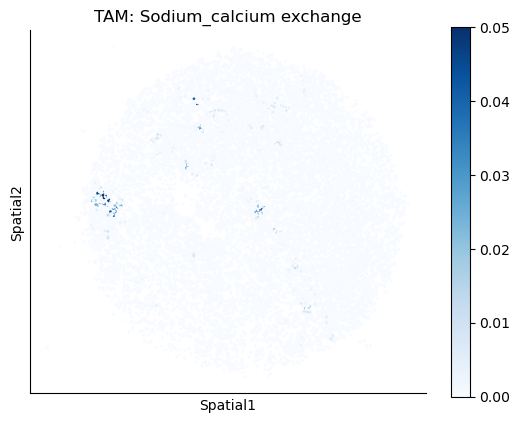

Puck_200727_08


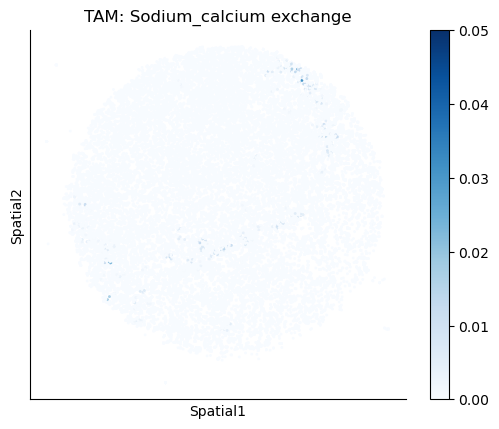

Puck_220408_13


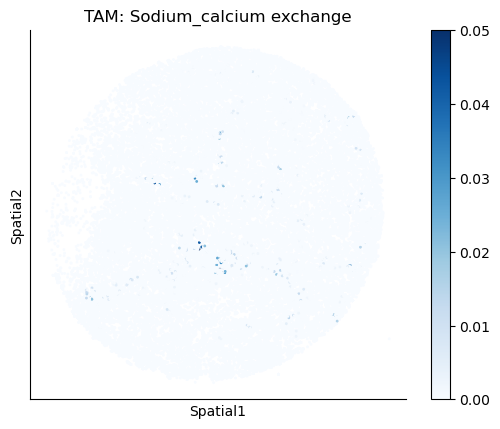

Puck_220408_20


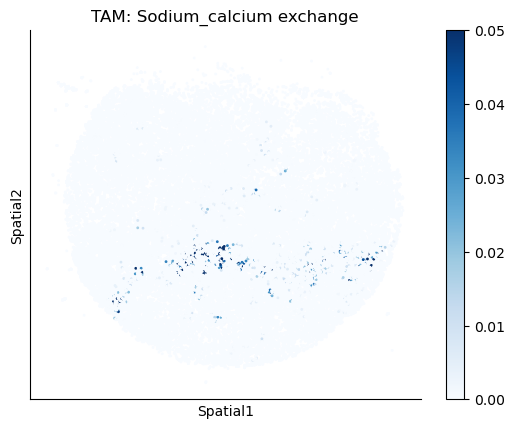

Puck_200727_09


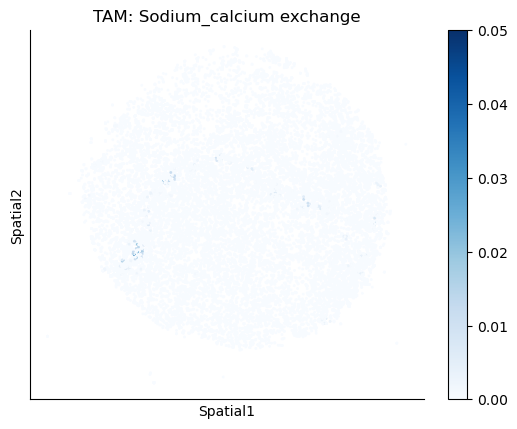

Puck_220408_14


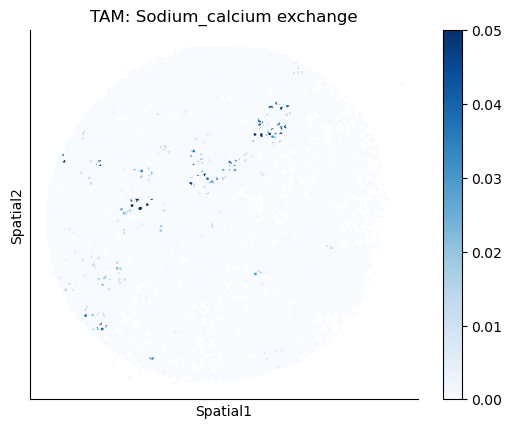

Puck_220408_15


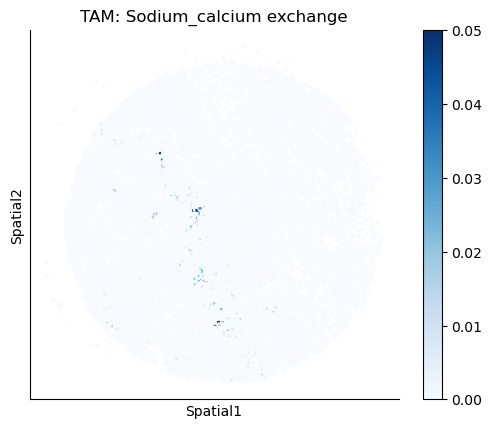

Puck_200727_10


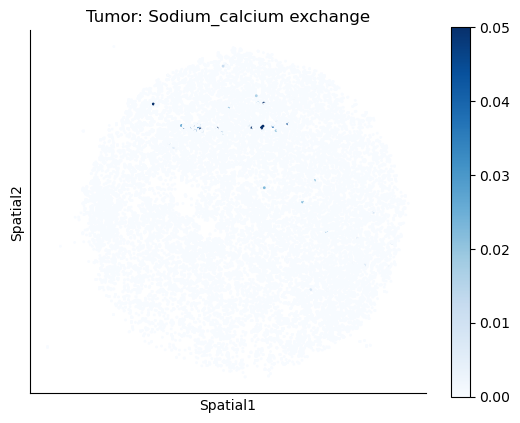

Puck_200727_08


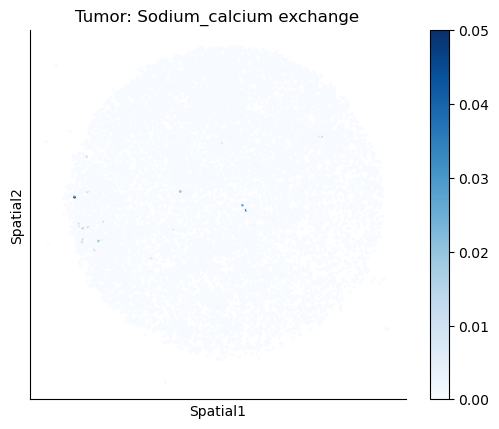

Puck_220408_13


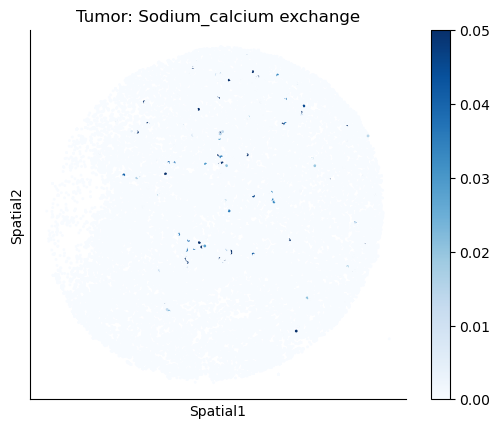

Puck_220408_20


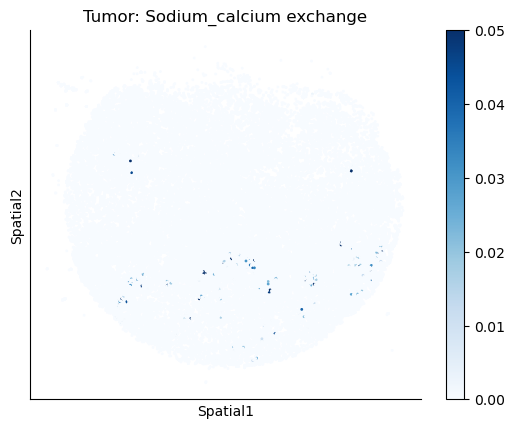

Puck_200727_09


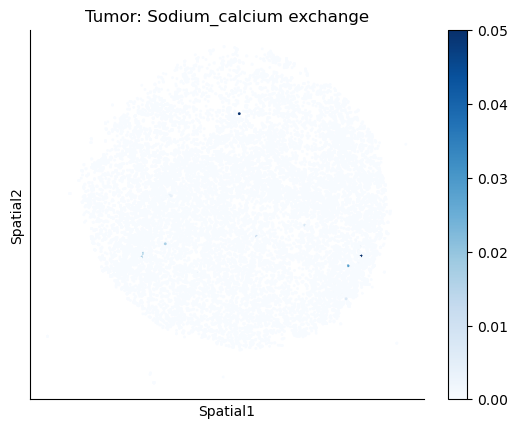

Puck_220408_14


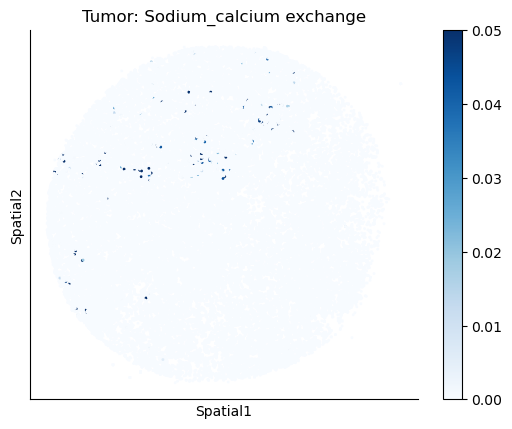

Puck_220408_15


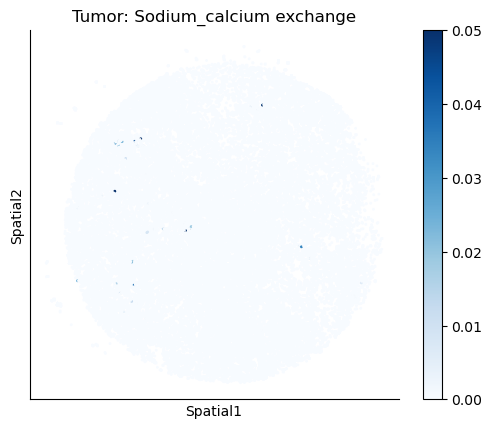

Puck_200727_10


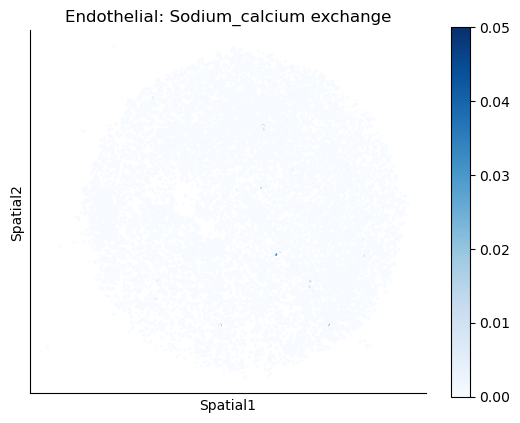

Puck_200727_08


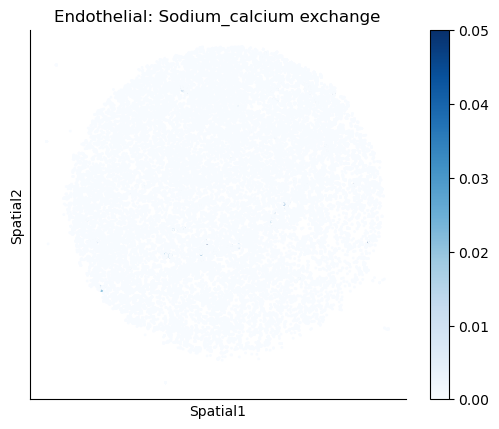

Puck_220408_13


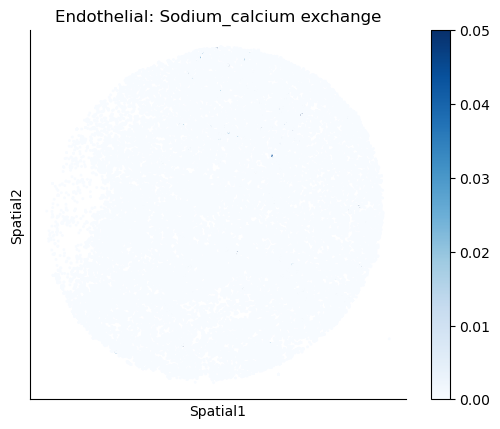

Puck_220408_20


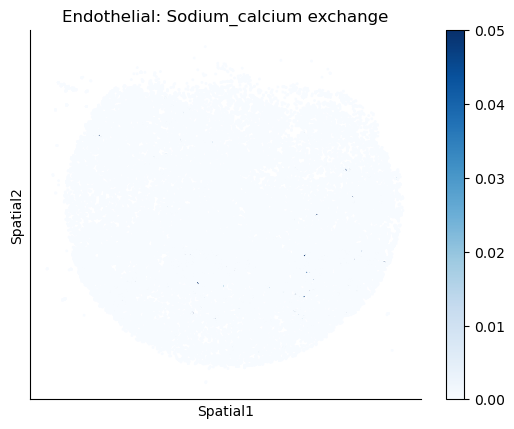

Puck_200727_09


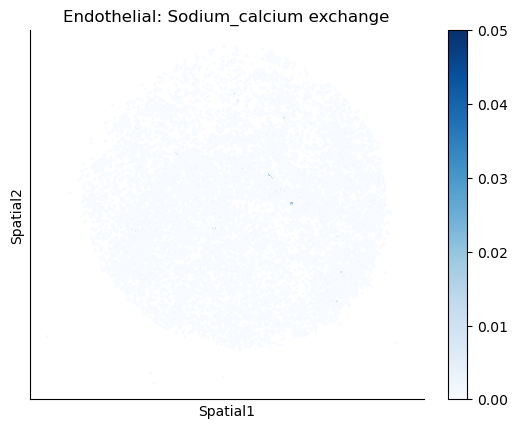

Puck_220408_14


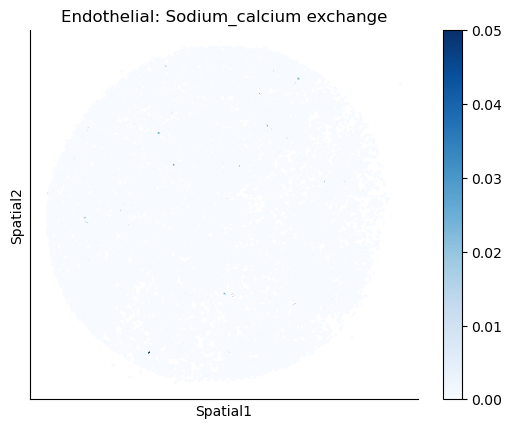

Puck_220408_15


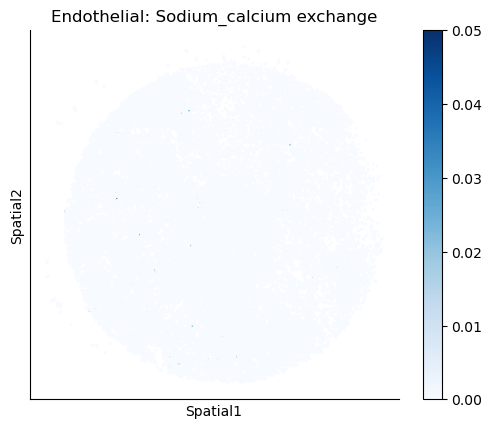

Puck_200727_10


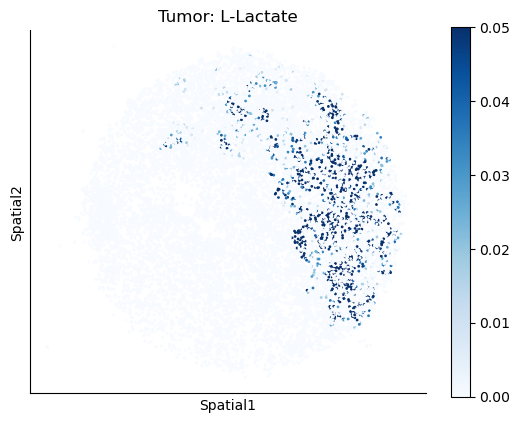

Puck_200727_08


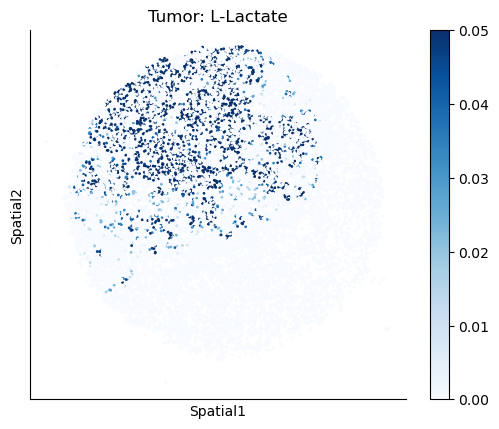

Puck_220408_13


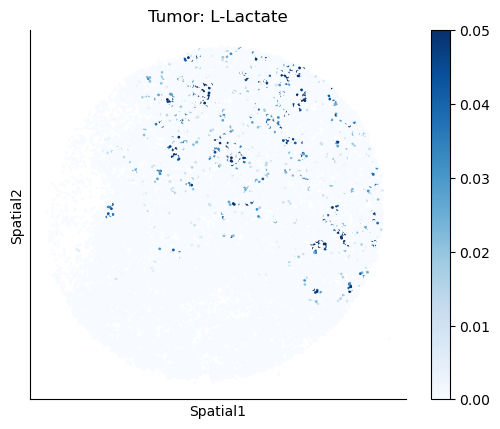

Puck_220408_20


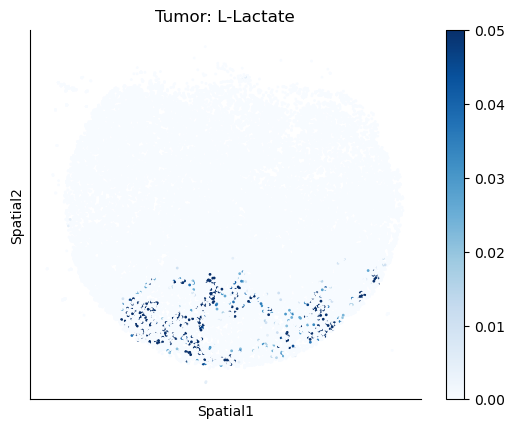

Puck_200727_09


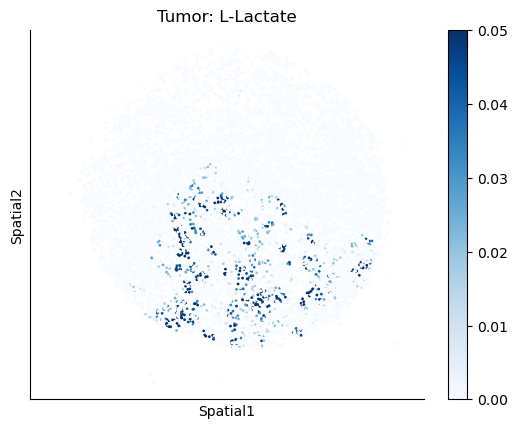

Puck_220408_14


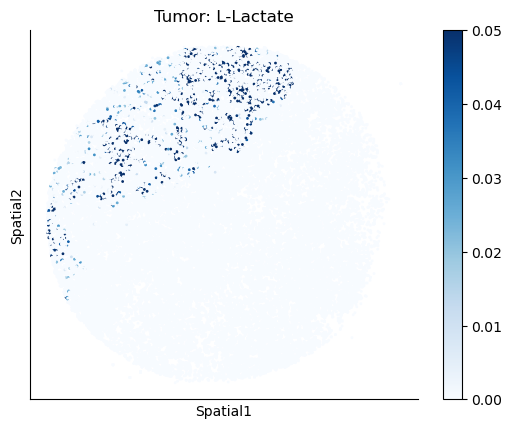

Puck_220408_15


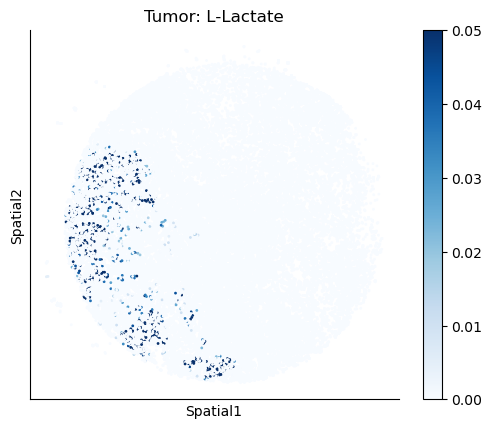

In [17]:
harreman.pl.plot_ct_interacting_cell_scores(adata, interactions=['L-Lactate', 'Sodium_calcium exchange'], cell_type_pair=['Tumor', 'TAM', 'Endothelial', 'CD8+ T cell'], agg_only=True, test='non-parametric', coords_obsm_key='spatial', s=1, vmin=0, vmax=0.05, normalize_values=True, cmap='Blues', sample_specific=True)

In [6]:
from matplotlib import colormaps
from copy import copy

In [7]:
def _prettify_axis(ax, spatial=False):
    # Hide the right and top spines
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position("left")
    ax.xaxis.set_ticks_position("bottom")
    if spatial:
        plt.xticks([])
        plt.yticks([])
        plt.xlabel("Spatial1")
        plt.ylabel("Spatial2")

In [8]:
def plot_ct_interaction(adata, scores, interaction, coords_obsm_key, s, vmin, vmax, figsize, cmap, colorbar, swap_y_axis):

    if isinstance(adata.obsm[coords_obsm_key], pd.DataFrame):
        coords = adata.obsm[coords_obsm_key].values
    else:
        coords = adata.obsm[coords_obsm_key]
    
    cmap = copy(colormaps.get_cmap(cmap))
    cmap.set_bad('#969696')
    
    score_values = scores[interaction].values
    valid_mask = ~np.isnan(score_values)
    coords_valid = coords[valid_mask]
    coords_nan = coords[~valid_mask]
    scores_valid = score_values[valid_mask]
    
    ax = plt.subplot(111)
    ax.set_aspect('equal', adjustable='box')
    _prettify_axis(ax, spatial=True)
    if swap_y_axis:
        plt.scatter(coords[:,0], -coords[:,1], c=scores[interaction], cmap=cmap, s=s, vmin=vmin, vmax=vmax)
    else:
        plt.scatter(coords_nan[:, 0], coords_nan[:, 1], c='#969696', s=s)
        plt.scatter(coords_valid[:,0], coords_valid[:,1], c=scores_valid, cmap=cmap, s=s, vmin=vmin, vmax=vmax)
    plt.title(interaction)
    if colorbar:
        plt.colorbar()

In [9]:
def plot_ct_interacting_cell_scores(
    adata,
    deconv_adata = None,
    cell_type_pair = None,
    interactions = None,
    coords_obsm_key = None,
    test = None,
    agg_only = False,
    normalize_values = False,
    sample_specific = False,
    s = None,
    vmin = None,
    vmax = None,
    figsize = (10,10),
    cmap = 'Reds',
    colorbar = True,
    swap_y_axis = False,
    save = False,
    show = False,
):
    
    if isinstance(vmin, str) and 'p' not in vmin:
        raise ValueError('"vmin" needs to be either a numeric value or a percentile: e.g. "p5".')
    if isinstance(vmax, str) and 'p' not in vmax:
        raise ValueError('"vmax" needs to be either a numeric value or a percentile: e.g. "p95".')
    
    if test not in ['parametric', 'non-parametric']:
        raise ValueError('The "test" variable should be one of ["parametric", "non-parametric"].')
    
    test_str = 'p' if test == 'parametric' else 'np'
    
    if sample_specific and 'sample_key' not in adata.uns.keys():
        raise ValueError('Sample information not found. Run Harreman using the "sample_key" parameter.')
    
    if deconv_adata is not None:
        adata.uns[f'ct_interacting_cell_results_{test_str}_gp_cs_df'] = deconv_adata.uns[f'ct_interacting_cell_results_{test_str}_gp_cs_df']
        adata.uns[f'ct_interacting_cell_results_{test_str}_m_cs_df'] = deconv_adata.uns[f'ct_interacting_cell_results_{test_str}_m_cs_df']
    
    if interactions is None:
        raise ValueError("Please provide a LR pair or a metabolite.")
    
    cell_type_pair = [] if cell_type_pair is None else cell_type_pair

    if not isinstance(cell_type_pair, list):
        raise ValueError(
            'The "cell_type_pair" variable must be None, a list of strings, or a list of tuples.'
        )
        
    ct_pairs = []
    if cell_type_pair:
        for ct in cell_type_pair:
            if isinstance(ct, tuple):
                ct_pairs.append(f"{ct[0]} - {ct[1]}")
            elif isinstance(ct, str):
                ct_pairs.append(ct)
            else:
                raise ValueError(
                    'Each element in "cell_type_pair" must be either a tuple or a string.'
                )
    
    interacting_cell_scores_gp = adata.obsm[f'ct_interacting_cell_results_{test_str}_gp_cs_df']
    interacting_cell_scores_m = adata.obsm[f'ct_interacting_cell_results_{test_str}_m_cs_df']
    
    def match_columns(df, ct_pairs, interactions):
        matched_columns = []
        per_cell_aggregation = {}
        for col in df.columns:
            ct_pair_str, interaction = col.split(': ', 1)
            if interaction not in interactions:
                continue
            if not ct_pairs:
                matched_columns.append(col)
                continue
            try:
                ct1, ct2 = ct_pair_str.split(' - ')
            except ValueError:
                continue  # skip malformed cell type pairs

            for query in ct_pairs:
                if ' - ' in query:
                    # Exact match of cell type pair
                    if query == f"{ct1} - {ct2}":
                        matched_columns.append(col)
                        break
                else:
                    # Single cell type: match if in either position
                    if query == ct1 or query == ct2:
                        matched_columns.append(col)
                        key = f"{query}: {interaction}"
                        if key not in per_cell_aggregation:
                            per_cell_aggregation[key] = df[col].copy()
                        else:
                            per_cell_aggregation[key] += df[col]
                        break

        selected_df = df[matched_columns]
        if per_cell_aggregation:
            agg_df = pd.concat(per_cell_aggregation, axis=1)
        else:
            agg_df = pd.DataFrame(index=df.index)  # empty fallback

        return selected_df, agg_df
    
    gp_selected, gp_aggregated = match_columns(interacting_cell_scores_gp, ct_pairs, interactions)
    m_selected, m_aggregated = match_columns(interacting_cell_scores_m, ct_pairs, interactions)
    
    dfs = [gp_aggregated, m_aggregated] if agg_only else [gp_selected, gp_aggregated, m_selected, m_aggregated]
    scores = pd.concat(dfs, axis=1)
    
    if normalize_values:
        scores = scores.apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=0) #We apply min-max normalization
    
    for interaction in scores.columns:
        if isinstance(vmin, str):
            vmin_new = float(vmin.split('p')[1])
            vmin_new = np.percentile(scores[interaction], vmin_new)
        else:
            vmin_new = vmin
        if isinstance(vmax, str):
            vmax_new = float(vmax.split('p')[1])
            vmax_new = np.percentile(scores[interaction], vmax_new)
        else:
            vmax_new = vmax
        
        mask = (adata.obs['cell_type'] == cell_type_pair[0]) & (scores[interaction] == 0)
        scores.loc[mask, interaction] = np.nan
        
        if sample_specific:
            sample_key = adata.uns['sample_key']
            for sample in adata.obs[sample_key].unique().tolist():
                print(sample)
                interaction_str = interaction.replace("/", "_").replace(": ", "_").replace(" ", "_")
                file = os.path.join(PLOTS_PATH, f'{sample}_{interaction_str}_score_spatial_plot_colorbar.pdf') if colorbar else os.path.join(PLOTS_PATH, f'{sample}_{interaction_str}_score_spatial_plot.pdf')
                plot_ct_interaction(adata[adata.obs[sample_key] == sample], scores.loc[adata.obs[sample_key] == sample], interaction, coords_obsm_key, s, vmin_new, vmax_new, figsize, cmap, colorbar, swap_y_axis)
                if save:
                    plt.savefig(file)
                if show:
                    plt.show()
                plt.close()
        else:
            plot_ct_interaction(adata, scores, interaction, coords_obsm_key, s, vmin_new, vmax_new, figsize, cmap, colorbar, swap_y_axis)
            plt.show()
            plt.close()

In [ ]:
s=1

In [46]:
plot_ct_interacting_cell_scores(adata, interactions=['L-Lactate'], cell_type_pair=['TAM'], agg_only=True, test='non-parametric', coords_obsm_key='spatial', s=s, vmin=0, vmax='p99.8', normalize_values=True, cmap='Blues', sample_specific=True, colorbar=False, save=True, show=False)

Puck_220408_20
Puck_220408_13
Puck_220408_15
Puck_200727_09
Puck_200727_10
Puck_200727_08
Puck_220408_14


In [47]:
plot_ct_interacting_cell_scores(adata, interactions=['L-Lactate'], cell_type_pair=['Tumor'], agg_only=True, test='non-parametric', coords_obsm_key='spatial', s=s, vmin=0, vmax='p99', normalize_values=True, cmap='Blues', sample_specific=True, colorbar=False, save=True, show=False)

Puck_220408_20
Puck_220408_13
Puck_220408_15
Puck_200727_09
Puck_200727_10
Puck_200727_08
Puck_220408_14


In [48]:
plot_ct_interacting_cell_scores(adata, interactions=['Sodium_calcium exchange'], cell_type_pair=['Tumor'], agg_only=True, test='non-parametric', coords_obsm_key='spatial', s=s, vmin=0, vmax='p99.9', normalize_values=True, cmap='Blues', sample_specific=True, colorbar=False, save=True, show=False)

Puck_220408_20
Puck_220408_13
Puck_220408_15
Puck_200727_09
Puck_200727_10
Puck_200727_08
Puck_220408_14


In [50]:
plot_ct_interacting_cell_scores(adata, interactions=['Sodium_calcium exchange'], cell_type_pair=['TAM'], agg_only=True, test='non-parametric', coords_obsm_key='spatial', s=s, vmin=0, vmax='p99', normalize_values=True, cmap='Blues', sample_specific=True, colorbar=False, save=True, show=False)

Puck_220408_20
Puck_220408_13
Puck_220408_15
Puck_200727_09
Puck_200727_10
Puck_200727_08
Puck_220408_14
